# import funcs and load hydrographics profiles ds

In [1]:
import numpy as np
import pandas as pd
from scipy import interpolate

import xarray as xr
import dask.array as da
from dask.distributed import Client

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches # for creating legend
import matplotlib.dates as mdates # converts datetime64 to datetime

import cartopy
import cartopy.crs as ccrs # for plotting
import cartopy.feature as cfeature # for map features
from cartopy.util import add_cyclic_point # for wrapping map fully - avoiding white line on 0 deg
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

import matplotlib.dates as mdates # converts datetime64 to datetime
import matplotlib.gridspec as gridspec # to create grid-shaped combos of axes
from mpl_toolkits import mplot3d # 3d plotting tool
import cmocean # for nice oceanography colour pallettes

#import argopy
#from argopy import DataFetcher as ArgoDataFetcher # to load Argo ds directly

import os # for finding files

import gsw # for conversion functions

from tqdm.notebook import tqdm_notebook as tqdm
import glob # for downloading data
import sys # for path to functions

import seaborn as sns

sns.set(#font='Franklin Gothic Book',
        rc={
         'axes.axisbelow': False,
         'axes.edgecolor': 'Black',
         'axes.facecolor': 'w', 
                            # '#aeaeae',
         'axes.grid': False,
         'axes.labelcolor': 'k',
         'axes.spines.right': True,
         'axes.spines.top': True,
         'figure.facecolor': 'white',
         'lines.solid_capstyle': 'round',
         'patch.edgecolor': 'k',
         'patch.force_edgecolor': True,
         'text.color': 'k',
         'xtick.bottom': True,
         'xtick.color': 'k',
         'xtick.direction': 'out',
         'xtick.top': False,
         'ytick.color': 'k',
         'ytick.direction': 'out',
         'ytick.left': True,
         'ytick.right': False},
         font_scale=1)
mpl.rcParams["figure.titlesize"] = 25
mpl.rcParams["axes.titlesize"] = 22
mpl.rcParams["axes.labelsize"] = 18
mpl.rcParams["font.size"] = 12
mpl.rcParams["xtick.labelsize"] = 15
mpl.rcParams["ytick.labelsize"] = 15
mpl.rcParams["ytick.labelright"] = False

from warnings import filterwarnings as fw
fw('ignore')

# import my own funcs
import sys
sys.path.append('/home/theospira/notebooks/projects/WW_climatology/functions')
from plot_formatting import circular_boundary,plot_nice_box
from inspection_funcs import boxplot

import importlib
#importlib.reload(sys.modules['inspection_plot'])

### load stuff

In [2]:
# QC'ed data with mixed layer
ds = xr.open_dataset('/home/theospira/notebooks/projects/WW_climatology/data/hydrographic_profiles/qc_profile_ds_2dbar.nc')

In [3]:
# take only profiles south of SAF, which is max at -40.5°S
idx = np.where(ds.lat < -40)[0]

ds = ds.sel(pres=slice(10,400)).isel(n_prof=idx)
ds['n_prof'] = np.arange(ds.n_prof.size)

# calculate n2 and add to ds
g = 9.8
rho0 = 1025
ds['n2'] = -g/rho0 * ds.rho.diff(dim='pres') / -ds.pres.diff('pres')

ds['sig'] = gsw.sigma0(ds.asal, ds.ctemp)

KeyboardInterrupt: 

In [ ]:
idx.size

In [ ]:
ds

# smoothing inspection

## inspect first on 50 random profiles

In [21]:
from scipy.ndimage import gaussian_filter1d as gf
from scipy.signal  import savgol_filter as sgf

In [18]:
# inspect 50 random profiles that are ~south of PF (so likely contain WW)
# note pf min position -72.5° and mean is -54°

from random import randint

idx = np.where(ds.lat < -54)[0]
tmp = ds.sel(pres=slice(10,400)).isel(n_prof=idx) 

idx = []
for i in range(100):
    idx += randint(0,tmp.n_prof.size-1),

chk = tmp.isel(n_prof=idx)

Text(0.5, 0.98, 'savitzky golay filter')

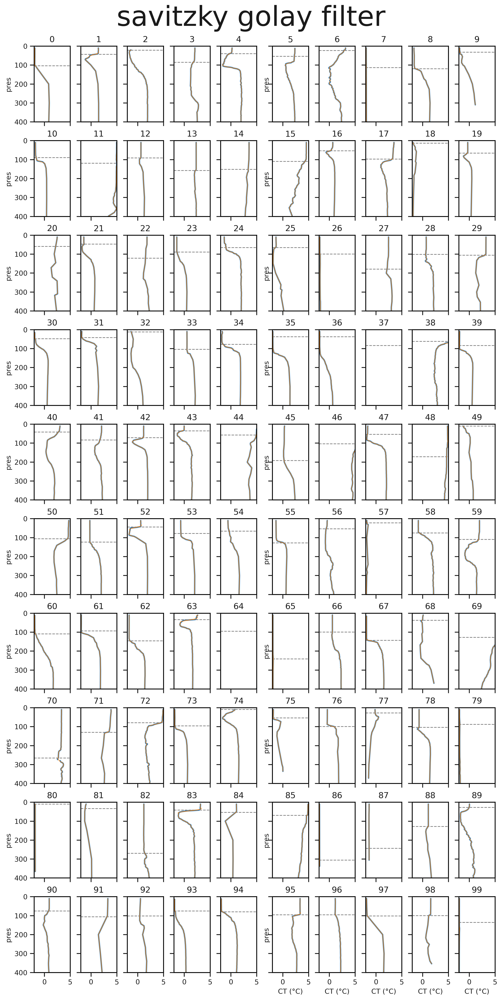

In [23]:
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10

m = 21
n = 4

fig,ax = plt.subplots(10,10,figsize=[10,20],constrained_layout=True,dpi=300,sharex='col',sharey='row',
                     )
ax=ax.flatten()

for i,a in enumerate(ax):
    tmp2 = chk.isel(n_prof=i).ctemp
    
    tmp2.plot(y='pres',ax=a,c='#377eb8',lw=2)
    a.axes.axhline(chk.isel(n_prof=i).mlp,ls='--',c='grey',lw=1)
    a.plot(sgf(tmp2[np.isfinite(tmp2)],m,n),
           tmp.pres[np.isfinite(tmp2.data)],c='#ff7f00',lw=0.75)
   # a.plot(gf(tmp2[np.isfinite(tmp2)],2),
    #       tmp.pres[np.isfinite(tmp2.data)],c='#4daf4a',lw=.75)
    
    a.set_xlabel('')
    a.set_ylabel('')
    a.set_xlim(-2,5)
    
    a.set_title(i,fontsize=12)
    a.axes.invert_yaxis()
    a.set_ylim(400,0)
    
for i,a in enumerate(ax[::5]):
    a.set_ylabel('pres',fontsize=10)
for i,a in enumerate(ax[-5:]):
    a.set_xlabel('CT (°C)',fontsize=10)
    
fig.suptitle('savitzky golay filter')

Text(0.5, 0.98, 'gauss filter')

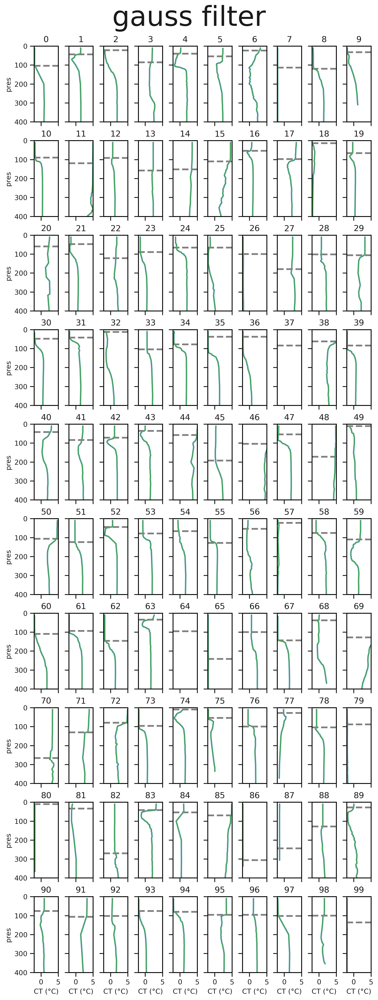

In [24]:
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10

x=10
fig,ax = plt.subplots(x,10,figsize=[7.5,20],constrained_layout=True,dpi=300,sharex='col',sharey='row',
                     )
ax=ax.flatten()

for i,a in enumerate(ax):
    tmp2 = chk.isel(n_prof=i).ctemp
    
    tmp2.plot(y='pres',ax=a,c='#377eb8',lw=2)
    a.axes.axhline(chk.isel(n_prof=i).mlp,ls='--',c='grey',lw=2.5)
 #   a.plot(sgf(tmp2[np.isfinite(tmp2)],m,n),
  #         tmp.pres[np.isfinite(tmp2.data)],c='#ff7f00',lw=0.75)
    a.plot(gf(tmp2[np.isfinite(tmp2)],2),
           tmp.pres[np.isfinite(tmp2.data)],c='#4daf4a',lw=1.25)
    
    
    
    a.axes.invert_yaxis()
    a.set_xlabel('')
    a.set_ylabel('')
    a.set_xlim(-2,5)
    
    a.set_title(i,fontsize=12)
    a.set_ylim(400,0)

for i,a in enumerate(ax[::x]):
    a.set_ylabel('pres',fontsize=10)
for i,a in enumerate(ax[-x:]):
    a.set_xlabel('CT (°C)',fontsize=10)
    
fig.suptitle('gauss filter')

In [34]:
tmp2

<xarray.Dataset>
Dimensions:  (pres: 196)
Coordinates:
    lon      float64 ...
    lat      float64 -71.04
    time     datetime64[ns] ...
    n_prof   int64 643059
  * pres     (pres) int64 10 12 14 16 18 20 22 ... 388 390 392 394 396 398 400
Data variables:
    ctemp    (pres) float32 ...
    mlp      int64 ...
Attributes:
    description:  Interpolated dataset from 2004 to 2021. Contains MLD from p...

Text(0.5, 0.98, 'difference with mixed layer temperature')

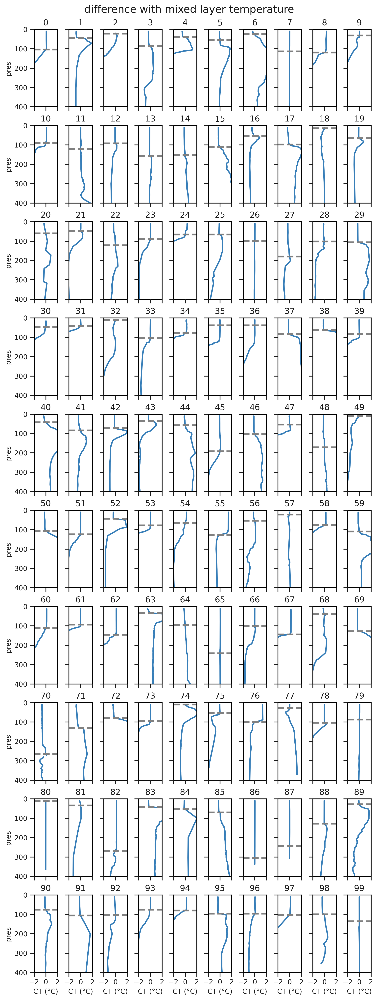

In [40]:
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10

x=10
fig,ax = plt.subplots(x,10,figsize=[7.5,20],constrained_layout=True,dpi=300,sharex='col',sharey='row',
                     )
ax=ax.flatten()

for i,a in enumerate(ax):
    tmp2 = chk.isel(n_prof=i)[['ctemp','mlp']]
    
    (tmp2.sel(pres=tmp2.mlp.data).ctemp - tmp2.ctemp).plot(y='pres',ax=a,c='#377eb8',lw=2)
    a.axes.axhline(chk.isel(n_prof=i).mlp,ls='--',c='grey',lw=2.5)
 #   a.plot(sgf(tmp2[np.isfinite(tmp2)],m,n),
  #         tmp.pres[np.isfinite(tmp2.data)],c='#ff7f00',lw=0.75)
#    a.plot(gf(tmp2[np.isfinite(tmp2)],2),
 #          tmp.pres[np.isfinite(tmp2.data)],c='#4daf4a',lw=1.25)
    
    
    
    a.axes.invert_yaxis()
    a.set_xlabel('')
    a.set_ylabel('')
    a.set_xlim(-2,2)
    
    a.set_title(i,fontsize=12)
    a.set_ylim(400,0)

for i,a in enumerate(ax[::x]):
    a.set_ylabel('pres',fontsize=10)
for i,a in enumerate(ax[-x:]):
    a.set_xlabel('CT (°C)',fontsize=10)
    
fig.suptitle('difference with ML temperature',fontsize=15)

Text(0.5, 0.98, 'Gaussian filter (1d, sd=2)')

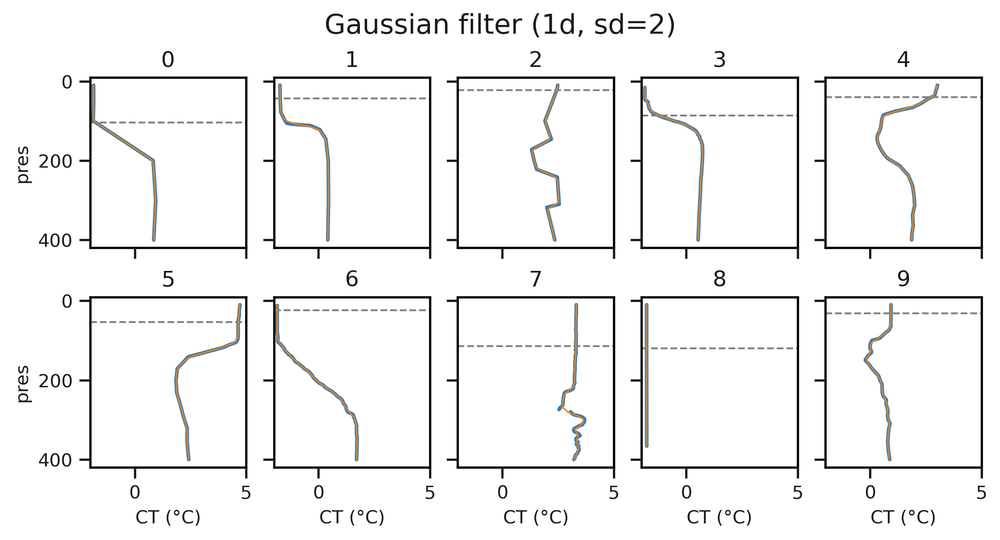

In [25]:
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10

m = 21
n = 4

fig,ax = plt.subplots(2,5,figsize=[7.5,4],constrained_layout=True,dpi=300,sharex='col',sharey='row',
                     )
ax=ax.flatten()

for i,a in enumerate(ax):
    tmp2 = chk.ctemp[::10].isel(n_prof=i)
    
    tmp2.plot(y='pres',ax=a,c='#377eb8',lw=2)
    a.axes.axhline(chk.isel(n_prof=i).mlp,ls='--',c='grey',lw=1)
 #   a.plot(sgf(tmp2[np.isfinite(tmp2)],m,n),
  #         tmp.pres[np.isfinite(tmp2.data)],c='#ff7f00',lw=0.75)
    a.plot(gf(tmp2[np.isfinite(tmp2)],3),
           tmp.pres[np.isfinite(tmp2.data)],c='#ff7f00',lw=.75)
    
    
    
    a.axes.invert_yaxis()
    a.set_xlabel('')
    a.set_ylabel('')
    a.set_xlim(-2,5)
    
    a.set_title(i,fontsize=12)

for i,a in enumerate(ax[::5]):
    a.set_ylabel('pres',fontsize=10)
for i,a in enumerate(ax[-5:]):
    a.set_xlabel('CT (°C)',fontsize=10)
    
fig.suptitle('Gaussian filter (1d, sd=2)',fontsize=15)

Text(0.5, 0.98, 'Savitsky Golay filter')

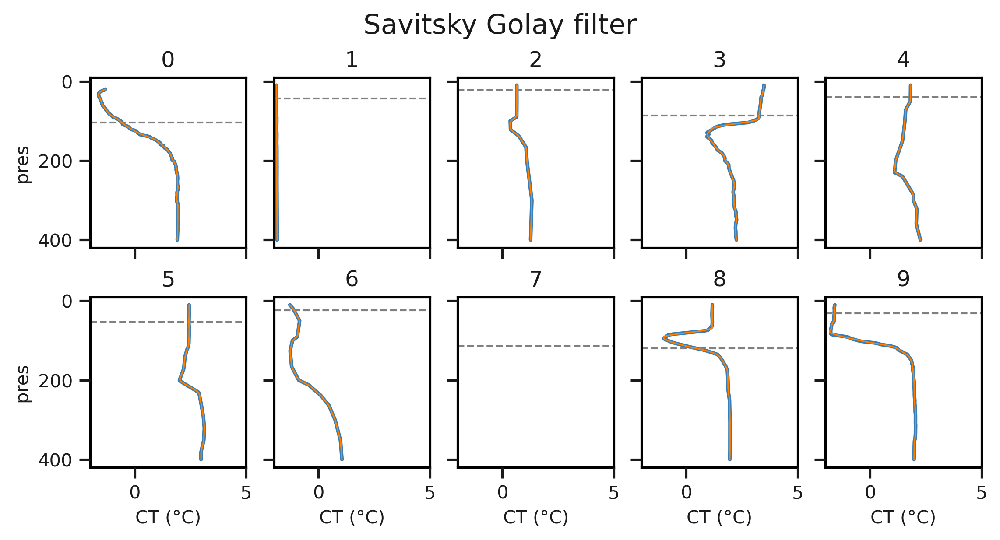

In [26]:
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10

m = 21
n = 4

fig,ax = plt.subplots(2,5,figsize=[7.5,4],constrained_layout=True,dpi=300,sharex='col',sharey='row',
                     )
ax=ax.flatten()

for i,a in enumerate(ax):
    tmp2 = chk.ctemp[2::5].isel(n_prof=i)
    
    tmp2.plot(y='pres',ax=a,c='#377eb8',lw=2)
    a.axes.axhline(chk.isel(n_prof=i).mlp,ls='--',c='grey',lw=1)
    a.plot(sgf(tmp2[np.isfinite(tmp2)],m,n),
           tmp.pres[np.isfinite(tmp2.data)],c='#ff7f00',lw=0.75)
 #   a.plot(gf(tmp2[np.isfinite(tmp2)],3),
  #         tmp.pres[np.isfinite(tmp2.data)],c='#ff7f00',lw=.75)
    
    
    
    a.axes.invert_yaxis()
    a.set_xlabel('')
    a.set_ylabel('')
    a.set_xlim(-2,5)
    
    a.set_title(i,fontsize=12)

for i,a in enumerate(ax[::5]):
    a.set_ylabel('pres',fontsize=10)
for i,a in enumerate(ax[-5:]):
    a.set_xlabel('CT (°C)',fontsize=10)
    
fig.suptitle('Savitsky Golay filter',fontsize=15)

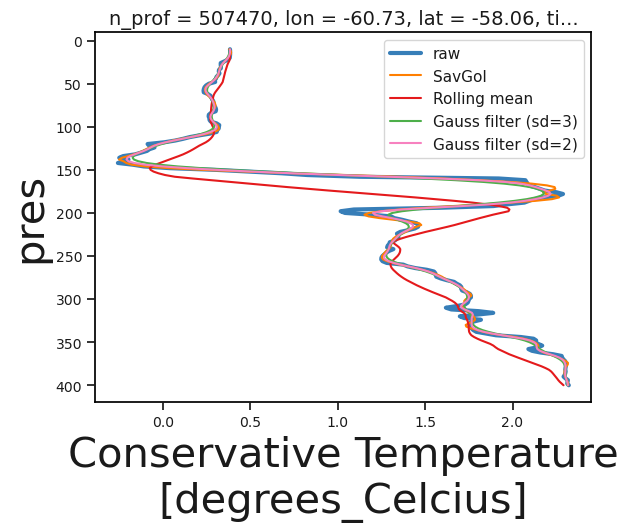

In [327]:
#m,n = 50,4

tmp = chk.isel(n_prof=45)

tmp.ctemp.plot(y='pres',lw=3,c='#377eb8')
plt.plot(sgf(tmp.ctemp[np.isfinite(tmp.ctemp)],m,n),
           tmp.pres[np.isfinite(tmp.ctemp.data)],c='#ff7f00',lw=1.5)

tmp.ctemp.rolling({'pres':20},min_periods=1).mean('pres').plot(y='pres',lw=1.5,c='#e41a1c')

plt.plot(gf(tmp.ctemp[np.isfinite(tmp.ctemp)],3),
           tmp.pres[np.isfinite(tmp.ctemp.data)],c='#4daf4a',lw=1.5)

plt.plot(gf(tmp.ctemp[np.isfinite(tmp.ctemp)],2),
           tmp.pres[np.isfinite(tmp.ctemp.data)],c='#f781bf',lw=1.5)

plt.gca().invert_yaxis()

plt.legend(['raw','SavGol','Rolling mean','Gauss filter (sd=3)','Gauss filter (sd=2)'])

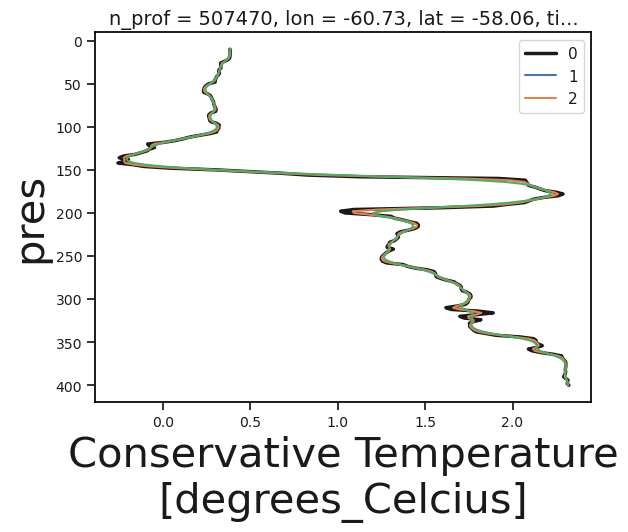

In [328]:
sig = np.arange(0,3,1)
tmp.ctemp.plot(y='pres',lw=2.5,c='k')
for i in sig:
    plt.plot(gf(tmp.ctemp[np.isfinite(tmp.ctemp)],i),
               tmp.pres[np.isfinite(tmp.ctemp.data)],lw=1.5)
plt.gca().invert_yaxis()

plt.legend(sig)

profile idx:   0%|          | 0/10 [00:00<?, ?it/s]

Text(0.5, 0.98, 'gauss filtered profiles')

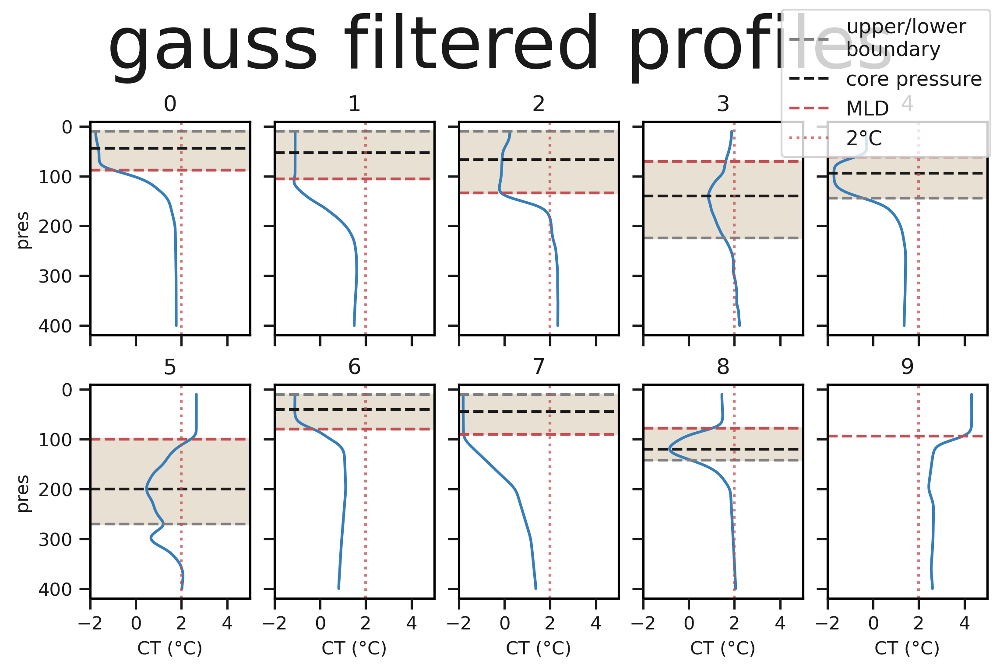

In [339]:
chk2 = chk.isel(n_prof=np.arange(0,100,11))

# gauss filtering of vars
dvars = ['ctemp','asal','rho','n2']
for d in dvars:
    chk2[d] = xr.DataArray(gf(chk2[d].data,4),dims={'n_prof':chk2.n_prof.data,'pres':chk2.pres.data},
                                        coords={'n_prof':chk2.n_prof.data,'pres':chk2.pres.data})
chk2 = calc_ww(chk2)

mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10

fig,ax = plt.subplots(2,5,figsize=[7.5,5],constrained_layout=True,dpi=300,sharex='col',sharey='row',
                     )
ax=ax.flatten()

for i,a in enumerate(ax):
    tmp2 = chk2.isel(n_prof=i)
    
    tmp2.ctemp.plot(y='pres',ax=a,c='#377eb8',lw=1.5)
    l1 = a.axes.axhline(tmp2.up_bd,ls='--',c='grey')
    l2 = a.axes.axhline(tmp2.lw_bd,ls='--',c='grey')
    l3 = a.axes.axhline(tmp2.ww_cp,ls='--',c='k')
    l4 = a.axes.axhline(tmp2.mlp,ls='--',c='r')
    l5 = a.axes.axvline(2,ls=':',c='r',alpha=0.75)

    
    a.axes.invert_yaxis()
#    a.set_title(int(tmp2.n_prof),fontsize=10)
    a.set_xlabel('')
    a.set_ylabel('')
    a.set_xlim(-2,5)
    
    a.set_title(i,fontsize=12)
    a.set_xticks([-2,0,2,4])
    
    a.fill_between(x=np.arange(-2,6,0.1),y1=tmp2.up_bd,y2=tmp2.lw_bd,color='#e9e0d4')

for i,a in enumerate(ax[::5]):
    a.set_ylabel('pres',fontsize=10)
for i,a in enumerate(ax[-5:]):
    a.set_xlabel('CT (°C)',fontsize=10)
    
fig.legend([l1,l3,l4,l5],['upper/lower\nboundary','core pressure','MLD','2°C'])

fig.suptitle('gauss filtered profiles')

profile idx:   0%|          | 0/10 [00:00<?, ?it/s]

Text(0.5, 0.98, 'unfiltered profiles')

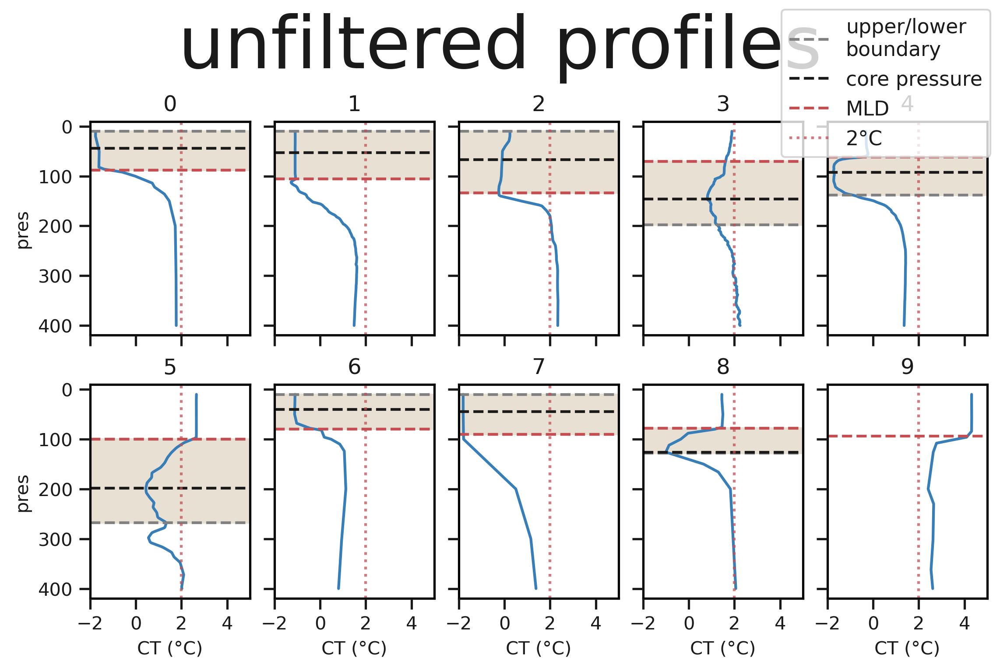

In [338]:
chk2 = chk.isel(n_prof=np.arange(0,100,11))
chk2 = calc_ww(chk2)

mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10

fig,ax = plt.subplots(2,5,figsize=[7.5,5],constrained_layout=True,dpi=300,sharex='col',sharey='row',
                     )
ax=ax.flatten()

for i,a in enumerate(ax):
    tmp2 = chk2.isel(n_prof=i)
    
    tmp2.ctemp.plot(y='pres',ax=a,c='#377eb8',lw=1.5)
    l1 = a.axes.axhline(tmp2.up_bd,ls='--',c='grey')
    l2 = a.axes.axhline(tmp2.lw_bd,ls='--',c='grey')
    l3 = a.axes.axhline(tmp2.ww_cp,ls='--',c='k')
    l4 = a.axes.axhline(tmp2.mlp,ls='--',c='r')
    l5 = a.axes.axvline(2,ls=':',c='r',alpha=0.75)

    
    a.axes.invert_yaxis()
    a.set_title(int(tmp2.n_prof),fontsize=10)
    a.set_xlabel('')
    a.set_ylabel('')
    a.set_xlim(-2,5)
    
    a.set_title(i,fontsize=12)
    a.set_xticks([-2,0,2,4])
    
    a.fill_between(x=np.arange(-2,6,0.1),y1=tmp2.up_bd,y2=tmp2.lw_bd,color='#e9e0d4')

for i,a in enumerate(ax[::5]):
    a.set_ylabel('pres',fontsize=10)
for i,a in enumerate(ax[-5:]):
    a.set_xlabel('CT (°C)',fontsize=10)
    
fig.legend([l1,l3,l4,l5],['upper/lower\nboundary','core pressure','MLD','2°C'])

fig.suptitle('unfiltered profiles')

## $T < T_{ML}$ for WW to exist below ML $\Rightarrow T - T_{ML} < 0 $

In [279]:
chk = calc_ww(chk)

profile idx:   0%|          | 0/50 [00:00<?, ?it/s]

In [280]:
chk

<xarray.Dataset>
Dimensions:  (n_prof: 50, pres: 196)
Coordinates:
  * n_prof   (n_prof) int64 461852 510722 164888 328297 ... 287599 208384 158210
  * pres     (pres) int64 10 12 14 16 18 20 22 ... 388 390 392 394 396 398 400
    lon      (n_prof) float64 ...
    lat      (n_prof) float64 -55.75 -70.31 -55.37 ... -60.14 -77.14 -63.62
    time     (n_prof) datetime64[ns] ...
Data variables: (12/17)
    temp     (n_prof, pres) float64 ...
    psal     (n_prof, pres) float64 ...
    dsource  (n_prof) object ...
    mld      (n_prof) float64 ...
    asal     (n_prof, pres) float32 ...
    ctemp    (n_prof, pres) float32 ...
    ...       ...
    ww_ct    (n_prof) float64 1.223 -1.785 0.1778 1.024 ... -0.6837 -1.92 -1.481
    ww_sa    (n_prof) float64 34.22 34.53 34.1 34.07 ... 34.6 34.2 34.77 34.33
    lw_bd    (n_prof) float64 240.0 68.0 134.0 110.0 ... 70.0 164.0 310.0 102.0
    ww_type  (n_prof) float64 2.0 2.0 2.0 2.0 2.0 2.0 ... 2.0 2.0 2.0 2.0 2.0
    thcc     (n_prof) float64 230.0 58.0 76.0 18.0 92.0 ... 60.0 92.0 300.0 50.0
    ww_n2    (n_prof) float64 0.0001395 0.0001471 ... 5.602e-05 0.003564
Attributes:
    description:  Interpolated dataset from 2004 to 2021. Contains MLD from p...

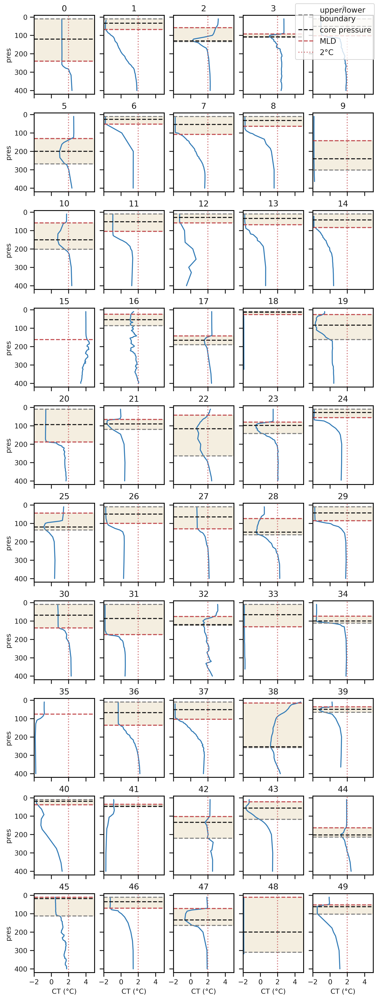

In [283]:
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10

m = 21
n = 10

fig,ax = plt.subplots(10,5,figsize=[7.5,20],constrained_layout=True,dpi=300,sharex='col',sharey='row',
                     )
ax=ax.flatten()

for i,a in enumerate(ax):
    tmp2 = chk.isel(n_prof=i)
    
    tmp2.ctemp.plot(y='pres',ax=a,c='#377eb8',lw=1.5)
    l1 = a.axes.axhline(tmp2.up_bd,ls='--',c='grey')
    l2 = a.axes.axhline(tmp2.lw_bd,ls='--',c='grey')
    l3 = a.axes.axhline(tmp2.ww_cp,ls='--',c='k')
    l4 = a.axes.axhline(tmp2.mlp,ls='--',c='r')
    l5 = a.axes.axvline(2,ls=':',c='r',alpha=0.75)

    
    a.axes.invert_yaxis()
#    a.set_title(int(tmp2.n_prof),fontsize=10)
    a.set_xlabel('')
    a.set_ylabel('')
    a.set_xlim(-2,5)
    
    a.set_title(i,fontsize=12)
    a.set_xticks([-2,0,2,4])
    a.fill_between(x=np.arange(-2,6,0.1),y1=tmp2.up_bd,y2=tmp2.lw_bd,color='#f4eee0')

for i,a in enumerate(ax[::5]):
    a.set_ylabel('pres',fontsize=10)
for i,a in enumerate(ax[-5:]):
    a.set_xlabel('CT (°C)',fontsize=10)
    
fig.legend([l1,l3,l4,l5],['upper/lower\nboundary','core pressure','MLD','2°C'])

# run smoothing on temp and psal then calc asal, ct, mlp and n2

In [2]:
import xarray as xr
import numpy as np
import pandas as pd

In [3]:
# QC'ed data with mixed layer
ds = xr.open_dataset('/home/theospira/notebooks/projects/WW_climatology/data/hydrographic_profiles/qc_profile_ds_2dbar.nc')

# take only profiles south of SAF, which is max at -40.5°S
idx = np.where(ds.lat < -40)[0]

ds = ds.sel(pres=slice(10,400)).isel(n_prof=idx)
ds['n_prof'] = np.arange(ds.n_prof.size)

In [3]:
idx.size

620293

In [4]:
# Import necessary libraries and modules
from scipy.ndimage import gaussian_filter1d as gf  # Import the Gaussian filter function from SciPy
import xarray as xr  # Import xarray for working with labeled multi-dimensional arrays

# Define a function for Gaussian filtering of vertical profiles in a dataset
def gauss_filter_z(ds, dvars=['temp', 'psal'], std=4):
    """
    Apply Gaussian filtering to vertical profiles of selected variables in a dataset.

    Parameters:
    -----------
    ds : xarray.Dataset
        The input dataset containing vertical profiles of oceanographic variables.

    dvars : list of str, optional
        A list of variable names to which Gaussian filtering will be applied.
        Default is ['temp', 'psal'].

    std : int or float, optional
        The standard deviation of the Gaussian filter. Default is 4.

    Returns:
    --------
    ds : xarray.Dataset
        The modified dataset with Gaussian-filtered variables.
    """
    # Iterate through the specified variables for Gaussian filtering
    for d in dvars:
        # Apply Gaussian filtering with the specified standard deviation
        ds[d] = xr.DataArray(
            gf(ds[d].data, std),  # Gaussian filter with the specified standard deviation
            dims={'n_prof': ds.n_prof.data, 'pres': ds.pres.data},  # Preserve dimensions
            coords={'n_prof': ds.n_prof.data, 'pres': ds.pres.data}  # Preserve coordinates
        )
        
    return ds  # Return the modified dataset with Gaussian-filtered variables

In [5]:
ds = gauss_filter_z(ds)

In [6]:
ds

<xarray.Dataset>
Dimensions:  (n_prof: 620293, pres: 196)
Coordinates:
    lon      (n_prof) float64 ...
    lat      (n_prof) float64 -57.46 -69.32 -58.43 ... -41.05 -42.42 -65.83
    time     (n_prof) datetime64[ns] ...
  * n_prof   (n_prof) int64 0 1 2 3 4 5 ... 620288 620289 620290 620291 620292
  * pres     (pres) int64 10 12 14 16 18 20 22 ... 388 390 392 394 396 398 400
Data variables:
    temp     (n_prof, pres) float64 1.849 1.835 1.809 1.773 ... 1.119 1.12 1.121
    psal     (n_prof, pres) float64 33.78 33.78 33.78 ... 34.68 34.68 34.68
    dsource  (n_prof) object ...
    mld      (n_prof) float64 ...
    asal     (n_prof, pres) float32 ...
    ctemp    (n_prof, pres) float32 ...
    rho      (n_prof, pres) float32 ...
    mlp      (n_prof) int64 ...
Attributes:
    description:  Interpolated dataset from 2004 to 2021. Contains MLD from p...

In [7]:
import gsw

# introduce absolute solinity into ds using gsw package
ds["asal"]=gsw.SA_from_SP(ds["psal"],ds["pres"]/1000,ds["lon"],ds["lat"]).astype("float32")
ds["asal"].name = "Salinity"
ds["asal"].attrs["long_name"] = "Absolute Salinity"
ds["asal"].attrs["standard_name"] = "ASAL"
ds["asal"].attrs["units"] = "g/kg"

# introduce conservative temp into ds using gsw package
ds["ctemp"]=gsw.CT_from_t(ds["asal"],ds["temp"],ds["pres"]/1000).astype("float32")
ds["ctemp"].name = "CT"
ds["ctemp"].attrs["long_name"] = "Conservative Temperature"
ds["ctemp"].attrs["standard_name"] = "CTEMP"
ds["ctemp"].attrs["units"] = "degrees_Celcius"

## this NEEDS to be calcs using SA and CT!!!
ds["rho"]=gsw.density.rho(ds["asal"],ds["ctemp"],ds["pres"]/1000).astype("float32")
ds["rho"].name = "Density"
ds["rho"].attrs["long_name"] = "In-situ Density"
ds["rho"].attrs["standard_name"] = "rho"
ds["rho"].attrs["units"] = "kg/m^-3"

ds['sig'] = gsw.sigma0(ds.asal, ds.ctemp)
ds["sig"].name = "Density"
ds["sig"].attrs["long_name"] = "Potential Density"
ds["sig"].attrs["standard_name"] = "sigma"
ds["sig"].attrs["units"] = "kg/m^-3"

In [11]:
#importlib.reload(sys.modules['calculations'])
from calculations import *

In [9]:
# import my own funcs
import sys
sys.path.append('/home/theospira/notebooks/projects/WW_climatology/functions')
from plot_formatting import circular_boundary,plot_nice_box
from inspection_funcs import boxplot

import importlib

from calculations import calc_mlp, calc_ww

ds = calc_mlp(ds)

# calculate n2 and add to ds
g = 9.8
rho0 = 1025
ds['n2'] = -g/rho0 * ds.rho.diff(dim='pres') / -ds.pres.diff('pres')

In [13]:
ds = calc_mlp(ds)

In [24]:
lp

array([ 94699,  22532, 123859, 415486, 202232, 457977, 480306, 415112,
       221122, 341984,  95637, 226658, 355920, 408268, 261846, 352531,
       262732, 386243, 563555, 420347, 489697, 330079, 326779, 136379,
       150871])

In [29]:
n2 = ds.n2
ct = ds.ctemp
mlp = ds.mlp
pres = ds.pres.data

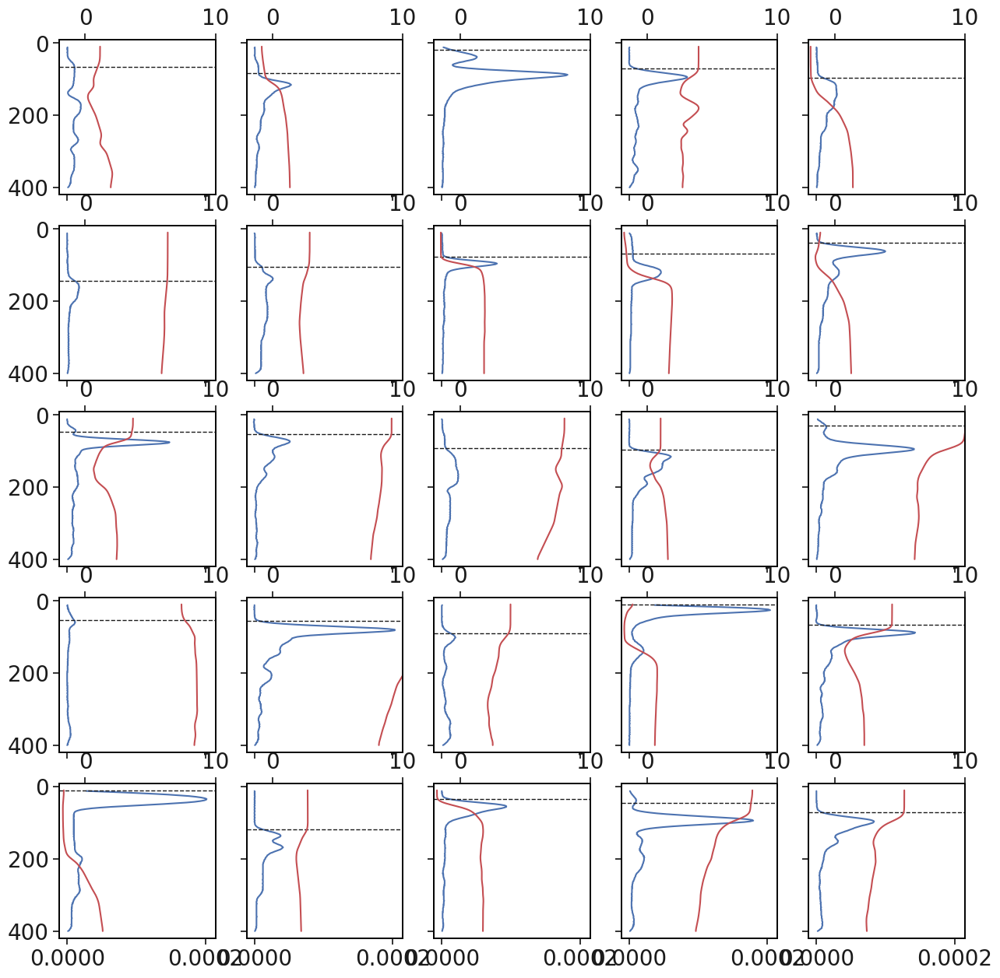

In [32]:
# integers to loop through:
lp = np.asarray(np.random.choice(ds.n_prof.size,25,replace=False))

fig,ax = plt.subplots(5,5,figsize=(15,15),sharey=1,sharex=1)
ax = ax.flatten()

# loop over
for l,a, in zip(lp,ax,):
    a.plot(n2[l],pres)
    a.axhline(mlp[l],c='k',lw=1,ls='--')
    a = a.twiny()
    a.plot(ct[l],pres,c='r')
    a.set_xlim(-2,10)

a.invert_yaxis()

# n2 WW detection

## WW defintion:

### $$
\text{Does WW contain a temperature inversion below ML?} \left\{
    \begin{array}\\
        \text{no}  & \Rightarrow \ \text{ML WW (type 1),} \\
        \text{yes} & \Rightarrow \ \text{Sub-ML WW (type 2).} \\
    \end{array}
\right.
$$

|                | WW Type 1  (ML)                             | WW Type 2 (subsurf)                        |
|----------------|---------------------------------------------|--------------------------------------------|
| upper boundary | 10dbar                                      | ML                                         |
| core           | mid-MLD and avg T in ML & $T_{core}$ < 2°C | $T_{min}$ s.t. up bd < core$_z$ < lw bd & $T_{min}$ < 2°C. check for temp difference from ML reference temp: $T < T_{ML}$. $\therefore \exists$ WW iff $T - T_{ML} < 0$|
| lower boundary | mld          |WW core < $\frac{dT}{dz}_{max}$ < 300dbar          |

In [2]:
ds = xr.open_dataset('/home/theospira/notebooks/projects/WW_climatology/data/hydrographic_profiles/superseded/ww_gauss_smoothed_ds-preDec23.nc')

In [3]:
ds_ss = ds.isel(n_prof = np.where(ds.ww_type==2)[0]).copy()

In [9]:
#n2 = ds_ss.n2
n2 = (-9.8/1025 * ds_ss.sig.diff(dim='pres') / -ds_ss.pres.diff('pres'))
ct = ds_ss.ctemp
cp = ds_ss.ww_cp.data
ub = ds_ss.lw_bd.data
lb = ds_ss.up_bd.data
mlp = ds_ss.mlp.data
pres = ds_ss.pres.data

In [4]:
#ds_tmp = ds_ss.isel(n_prof=np.where(ds_ss.ww_ct>0)[0]).copy()

# select only summer data
# should actually check autumn data
ds_tmp = ds_ss.isel(n_prof=np.where(ds_ss.time.dt.month == np.any([12,1,2]))[0]).copy()

In [7]:
# calculate n2 and add to ds
n2 = (-9.8/1025 * ds_tmp.sig.diff(dim='pres') / -ds_tmp.pres.diff('pres'))
#n2 = ds_tmp.n2
ct = ds_tmp.ctemp
cp = ds_tmp.ww_cp.data
ub = ds_tmp.lw_bd.data
lb = ds_tmp.up_bd.data
mlp = ds_tmp.mlp.data
pres = ds_tmp.pres.data

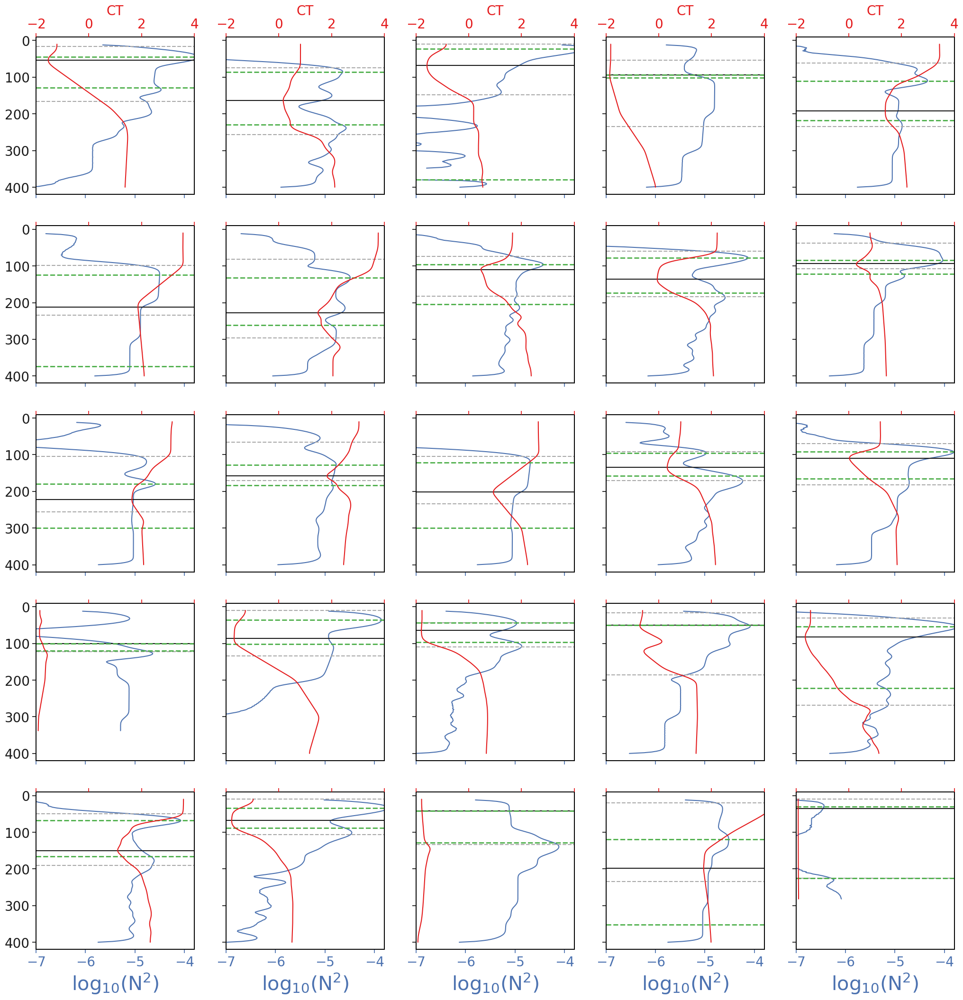

In [11]:
# integers to loop through:
r = 5
lp = np.asarray(np.random.choice(ds_ss.n_prof.size,r**2,replace=False))
#lp = np.asarray(np.random.choice(ds_tmp.n_prof.size,r**2,replace=False))

fig,ax = plt.subplots(r,r,figsize=(25,25),sharey=1,sharex=1)
ax = ax.flatten()

# loop over
for i,l,a, in zip(range(len(ax)),lp,ax,):
    tmp = n2[l]#.rolling({'pres':20},min_periods=1).mean()
    tmp_diff = tmp.diff('pres')
    a.plot(np.log10(tmp),pres[1:])
    a.tick_params(axis='x', colors='b')
    #a.plot(tmp.diff('pres'),pres[1:],alpha=0.5)
    # already calculated boundaries
    a.axhline(ub[l],c='darkgrey',ls='--')
    a.axhline(lb[l],c='darkgrey',ls='--')
    a.axhline(cp[l],c='k',)
    # boundaries as per n2 definition:
    if cp[l]>10:
        g = '#4daf4a'
        a.axhline(tmp.sel(pres=slice(mlp[l],cp[l])).idxmax(),c=g,ls='--',lw=2) # ub
        a.axhline(tmp_diff.sel(pres=slice(cp[l],400)).idxmax(),c=g,ls='--',lw=2) # lb
        #a.axhline(tmp_diff.sel(pres=slice(cp[l],400)).__abs__().idxmin(),c=g,ls='--',lw=2) # lb
    if i in range(r**2-r,r**2):
        a.set_xlabel(r'log$_{10}$(N$^2$)',c='b')
        a.set_xlim(-7,-3.8)

    # add temperature
    a = a.twiny()
    red = '#e41a1c'
    a.plot(ct[l],pres,c=red)
    a.set_xlim(-2,4)
    a.tick_params(axis='x', colors=red)
    if i in range(r,r**2):
        a.set_xticklabels('')
    else:
        a.set_xlabel('CT',fontsize=20,c=red)

a.invert_yaxis()

In [28]:
ds_tmp

<xarray.Dataset>
Dimensions:  (n_prof: 18014, pres: 196)
Coordinates:
  * n_prof   (n_prof) int64 0 1 2 4 5 7 ... 601402 601403 601409 601415 601417
  * pres     (pres) int64 10 12 14 16 18 20 22 ... 388 390 392 394 396 398 400
    lon      (n_prof) float64 ...
    lat      (n_prof) float64 ...
    time     (n_prof) datetime64[ns] 2004-01-01T10:01:28.999999744 ... 2021-0...
Data variables: (12/20)
    temp     (n_prof, pres) float64 ...
    psal     (n_prof, pres) float64 ...
    dsource  (n_prof) object ...
    mld      (n_prof) float64 ...
    asal     (n_prof, pres) float32 ...
    ctemp    (n_prof, pres) float32 ...
    ...       ...
    sig_c    (n_prof) float64 ...
    lw_bd    (n_prof) float64 118.0 164.0 124.0 150.0 ... 100.0 150.0 144.0
    ww_type  (n_prof) float64 2.0 2.0 2.0 2.0 2.0 2.0 ... 2.0 2.0 2.0 2.0 2.0
    thcc     (n_prof) float64 ...
    ww_n2    (n_prof) float64 ...
    ww_msk   (n_prof, pres) float64 ...
Attributes:
    description:  Interpolated dataset from 2004 to 2021. Contains MLD from p...

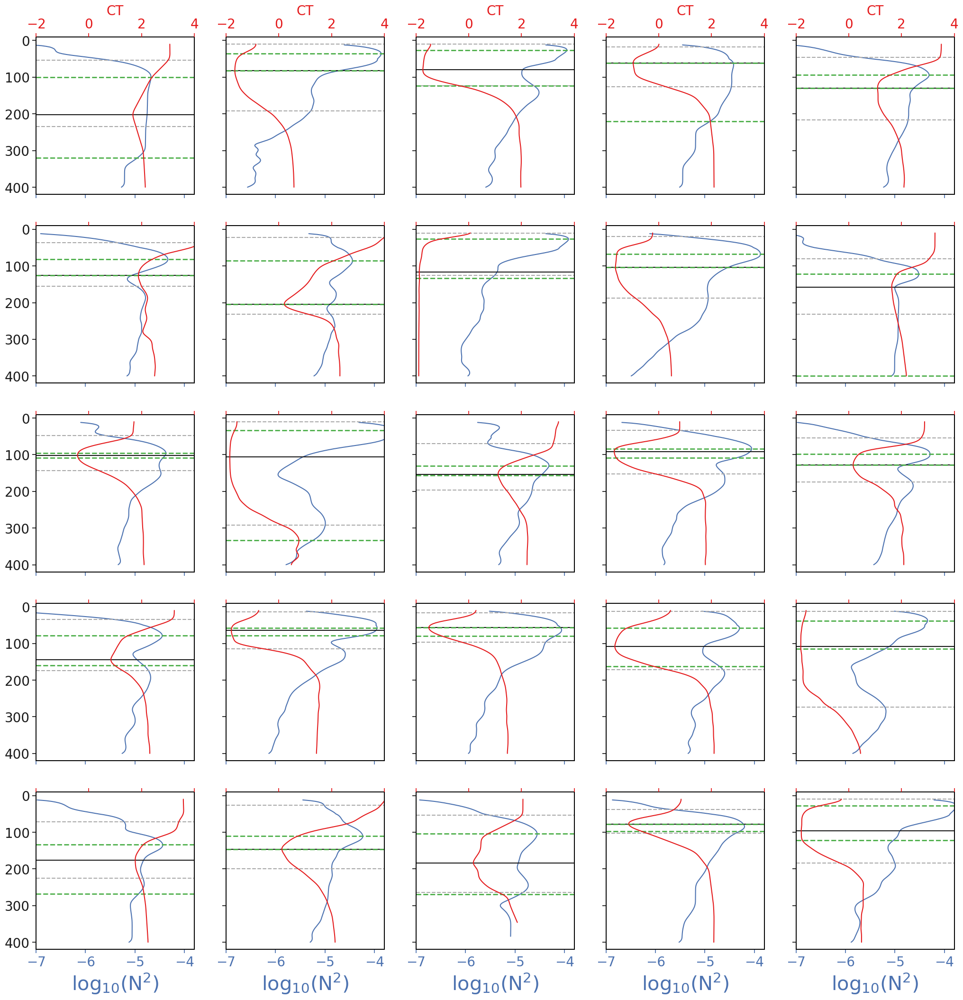

In [62]:
# integers to loop through:
#r = 5
#lp = np.asarray(np.random.choice(ds_tmp.n_prof.size,r**2,replace=False))

fig,ax = plt.subplots(r,r,figsize=(25,25),sharey=1,sharex=1)
ax = ax.flatten()

# loop over
for i,l,a, in zip(range(len(ax)),lp,ax,):
    tmp = n2[l].rolling({'pres':20},min_periods=1).mean()
    #tmp = ct[l]
    tmp_diff = tmp.diff('pres')
    a.plot(np.log10(tmp),pres[1:])
    a.tick_params(axis='x', colors='b')
    #a.plot(tmp.diff('pres'),pres[1:],alpha=0.5)
    # already calculated boundaries
    a.axhline(ub[l],c='darkgrey',ls='--')
    a.axhline(lb[l],c='darkgrey',ls='--')
    a.axhline(cp[l],c='k',)
    # boundaries as per n2 definition:
    if cp[l]>10:
        g = '#4daf4a'
        a.axhline(tmp.sel(pres=slice(mlp[l],cp[l])).idxmax(),c=g,ls='--',lw=2) # ub
        #a.axhline(tmp_diff.sel(pres=slice(cp[l],400)).idxmax(),c=g,ls='--',lw=2) # lb
        a.axhline(tmp_diff.sel(pres=slice(cp[l],400)).__abs__().idxmax(),c=g,ls='--',lw=2) # lb
    if i in range(r**2-r,r**2):
        a.set_xlabel(r'log$_{10}$(N$^2$)',c='b')
        a.set_xlim(-7,-3.8)

    # add temperature
    a = a.twiny()
    red = '#e41a1c'
    a.plot(ct[l],pres,c=red)
    a.set_xlim(-2,4)
    a.tick_params(axis='x', colors=red)
    if i in range(r,r**2):
        a.set_xticklabels('')
    else:
        a.set_xlabel('CT',fontsize=20,c=red)

a.invert_yaxis()

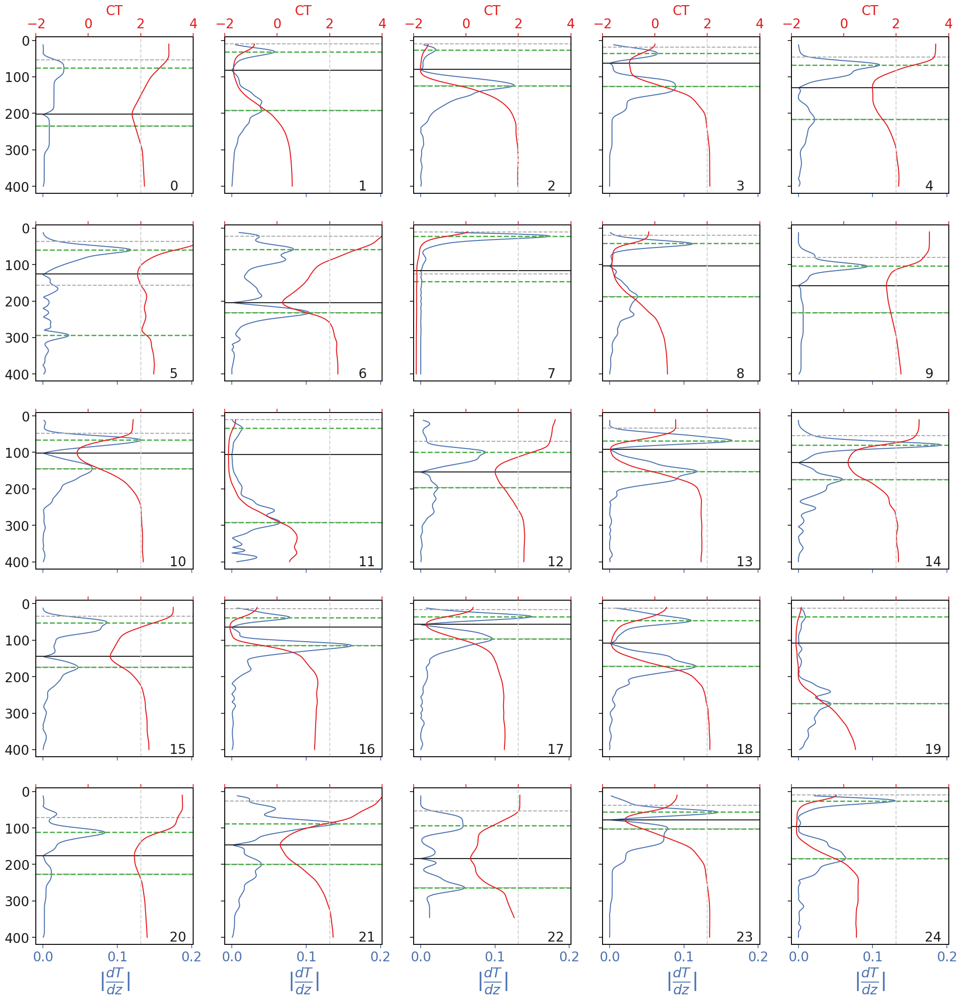

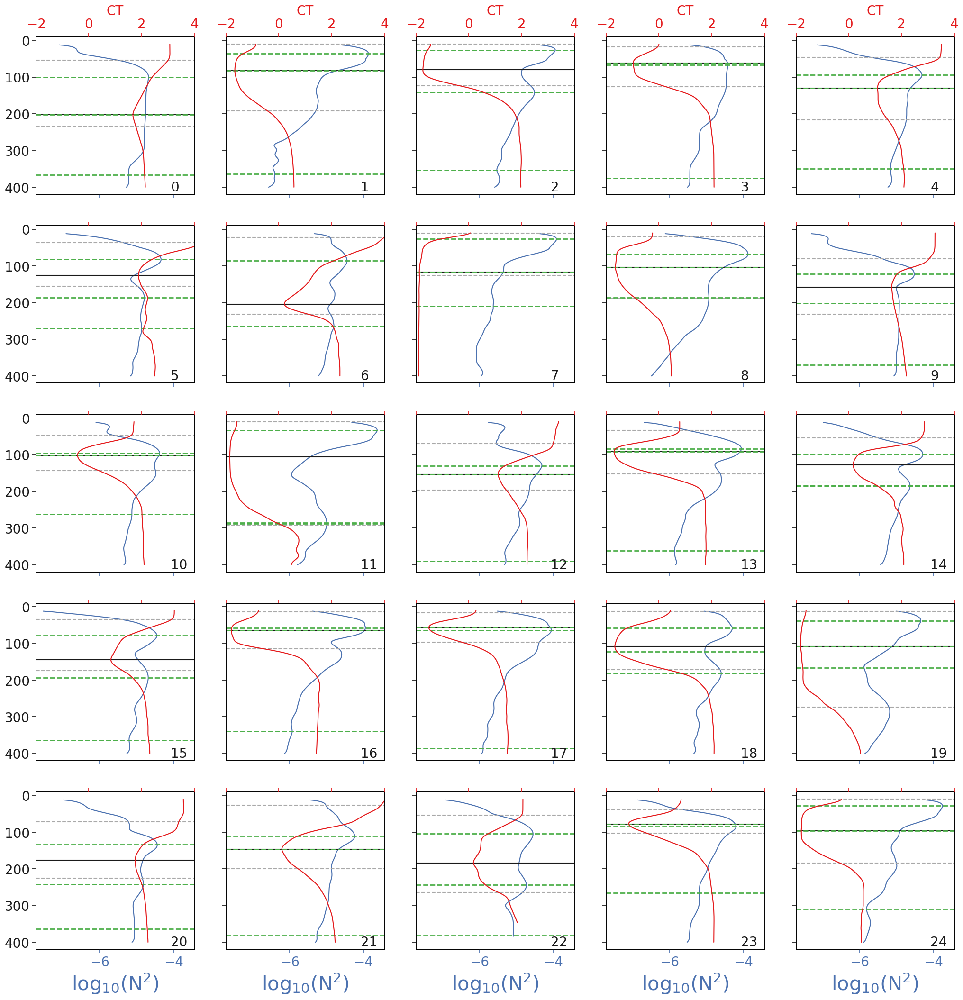

In [56]:
# integers to loop through:
#r = 5
#lp = np.asarray(np.random.choice(ds_tmp.n_prof.size,r**2,replace=False))

fig,ax = plt.subplots(r,r,figsize=(25,25),sharey=1,sharex=1)
ax = ax.flatten()

# loop over
for i,l,a, in zip(range(len(ax)),lp,ax,):
    #tmp = n2[l].rolling({'pres':20},min_periods=1).mean()
    tmp = ct[l]
    tmp_diff = tmp.diff('pres').__abs__()
    #a.plot(np.log10(tmp),pres[1:])
    a.tick_params(axis='x', colors='b')
    a.plot(tmp_diff,pres[1:],)
    # already calculated boundaries
    a.axhline(ub[l],c='darkgrey',ls='--')
    a.axhline(lb[l],c='darkgrey',ls='--')
    a.axhline(cp[l],c='k',)
    # boundaries as per n2 definition:
    if cp[l]>10:
        g = '#4daf4a'
        a.axhline(tmp_diff.sel(pres=slice(mlp[l],cp[l])).idxmax(),c=g,ls='--',lw=2) # ub
        a.axhline(tmp_diff.sel(pres=slice(cp[l],400)).idxmax(),c=g,ls='--',lw=2) # lb
        #a.axhline(tmp_diff.sel(pres=slice(cp[l],400)).__abs__().idxmin(),c=g,ls='--',lw=2) # lb
    if i in range(r**2-r,r**2):
        a.set_xlabel(r'$|\frac{dT}{dz}|$',c='b')
        #a.set_xlabel(r'dN^2/dz',c='b')
        #a.set_xlim(-7,-3.8)

    a.annotate(i,(0.85,0.02),xycoords='axes fraction')

    # add temperature
    a = a.twiny()
    red = '#e41a1c'
    a.plot(ct[l],pres,c=red)
    a.axvline(2,c='lightgrey',ls='--')
    a.set_xlim(-2,4)
    a.tick_params(axis='x', colors=red)
    if i in range(r,r**2):
        a.set_xticklabels('')
    else:
        a.set_xlabel('CT',fontsize=20,c=red)

a.invert_yaxis()

# integers to loop through:
#r = 5
#lp = np.asarray(np.random.choice(ds_tmp.n_prof.size,r**2,replace=False))

fig,ax = plt.subplots(r,r,figsize=(25,25),sharey=1,sharex=1)
ax = ax.flatten()

# loop over
for i,l,a, in zip(range(len(ax)),lp,ax,):
    tmp = n2[l].rolling({'pres':20},min_periods=1).mean()
    #tmp = ct[l]
    tmp_diff = tmp.diff('pres').__abs__()
    a.plot(np.log10(tmp),pres[1:])
    a.tick_params(axis='x', colors='b')
    #a.plot(tmp_diff,pres[1:],)
    # already calculated boundaries
    a.axhline(ub[l],c='darkgrey',ls='--')
    a.axhline(lb[l],c='darkgrey',ls='--')
    a.axhline(cp[l],c='k',)
    # boundaries as per n2 definition:
    if cp[l]>10:
        g = '#4daf4a'
        a.axhline(tmp.sel(pres=slice(mlp[l],cp[l])).idxmax(),c=g,ls='--',lw=2) # ub
        a.axhline(tmp.sel(pres=slice(cp[l],400)).idxmax(),c=g,ls='--',lw=2) # lb
        a.axhline(tmp_diff.sel(pres=slice(cp[l],400)).__abs__().idxmin(),c=g,ls='--',lw=2) # lb
    if i in range(r**2-r,r**2):
        a.set_xlabel(r'log$_{10}$(N$^2$)',c='b')
        #a.set_xlabel(r'$\frac{dN^2}{dz}$',c='b')
        #a.set_xlim(-7,-3.8)

    a.annotate(i,(0.85,0.02),xycoords='axes fraction')


    # add temperature
    a = a.twiny()
    red = '#e41a1c'
    a.plot(ct[l],pres,c=red)
    a.set_xlim(-2,4)
    a.tick_params(axis='x', colors=red)
    if i in range(r,r**2):
        a.set_xticklabels('')
    else:
        a.set_xlabel('CT',fontsize=20,c=red)


a.invert_yaxis()

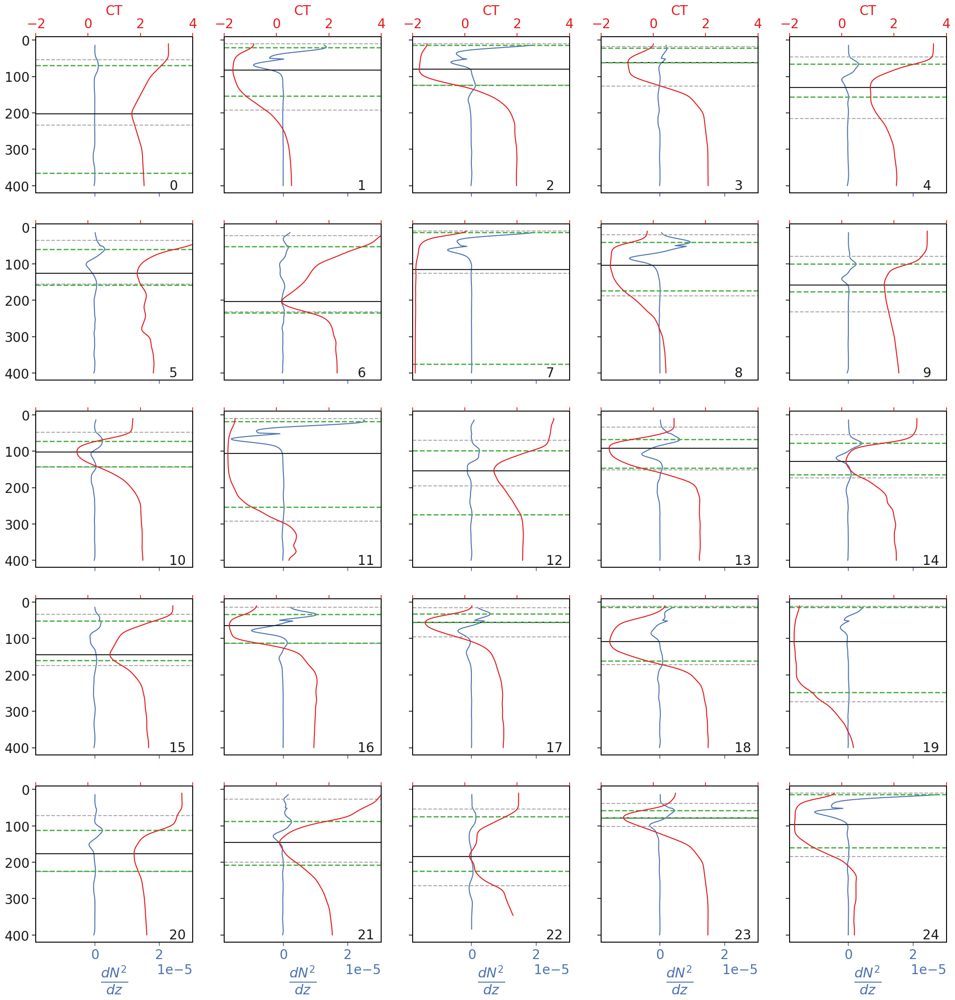

In [64]:
fig,ax = plt.subplots(r,r,figsize=(25,25),sharey=1,sharex=1)
ax = ax.flatten()

# loop over
for i,l,a, in zip(range(len(ax)),lp,ax,):
    tmp = n2[l].rolling({'pres':20},min_periods=1).mean()
    tmp_diff = tmp.diff('pres')
    #a.plot(np.log10(tmp),pres[1:])
    a.plot(tmp_diff,pres[2:],)
    a.tick_params(axis='x', colors='b')
    # already calculated boundaries
    a.axhline(ub[l],c='darkgrey',ls='--')
    a.axhline(lb[l],c='darkgrey',ls='--')
    a.axhline(cp[l],c='k',)
    # boundaries as per n2 definition:
    if cp[l]>10:
        g = '#4daf4a'
        a.axhline(tmp_diff.sel(pres=slice(mlp[l],cp[l])).idxmax(),c=g,ls='--',lw=2) # ub
        #a.axhline(tmp.sel(pres=slice(cp[l],400)).idxmax(),c=g,ls='--',lw=2) # lb
        a.axhline(tmp_diff.sel(pres=slice(cp[l],400)).idxmax(),c=g,ls='--',lw=2) # lb
    if i in range(r**2-r,r**2):
        #a.set_xlabel(r'log$_{10}$(N$^2$)',c='b')
        a.set_xlabel(r'$\frac{dN^2}{dz}$',c='b')
        #a.set_xlim(-7,-3.8)

    # add temperature
    a = a.twiny()
    red = '#e41a1c'
    a.plot(ct[l],pres,c=red)
    a.set_xlim(-2,4)
    a.tick_params(axis='x', colors=red)
    if i in range(r,r**2):
        a.set_xticklabels('')
    else:
        a.set_xlabel('CT',fontsize=20,c=red)

    a.annotate(i,(0.85,0.02),xycoords='axes fraction')

a.invert_yaxis()

# vectorised WW algorithm using temperature for WW detection

In [2]:
def update_da(da1, da2):
    """
    Updates the first dataset (`da1`) based on matching 'n_prof' dimensions with the second dataset (`da2`).

    Parameters:
    - da1 (xarray.Dataset): The initial dataset to be updated.
    - da2 (xarray.Dataset): The dataset providing the 'n_prof' values for selection/update.

    Returns:
    - xarray.Dataset: The updated version of `da1`, with selections made based on matching 'n_prof' values.
    """
    # Ensure both datasets have the 'n_prof' dimension
    assert 'n_prof' in da1.dims and 'n_prof' in da2.dims, \
        "Both datasets must have a 'n_prof' dimension."
    
    # find where profiles from da2 are with repsect to da1
    idx = np.where(np.isin(da1.n_prof, da2.n_prof))[0]
    return da1.isel(n_prof=idx)

In [3]:
ds = xr.open_dataset('/home/theospira/notebooks/projects/WW_climatology/data/hydrographic_profiles/superseded/ww_gauss_smoothed_ds-preDec23.nc')

In [4]:
# extract conservative temperature
ct = ds['ctemp']
# extract mixed layer temp
ml_t = ct.where(ds.pres < ds.mlp,).mean('pres')
# extract temp below ML
below_ml = ct.where(ds.pres > ds.mlp)
# compute temperature inversions based on mean ML temp
inversions = ml_t - below_ml

## locate vertical profiles that represent deep mixing

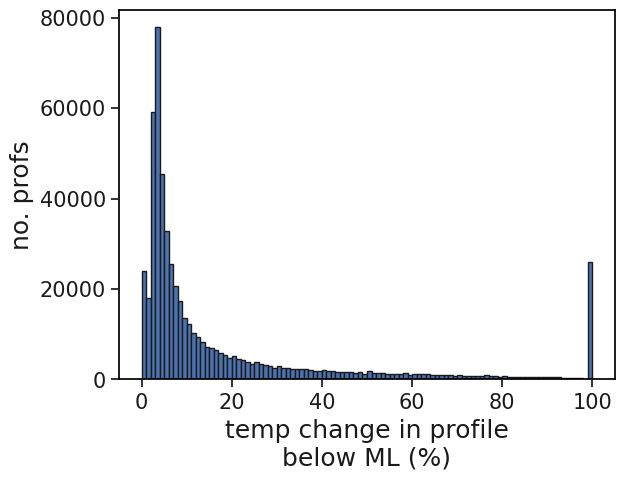

In [5]:
# compute number of inversions per profile as a percentage
# computed from below ML
pct_inv = (inversions.__abs__() < 0.25).sum('pres') / inversions.notnull().sum('pres') * 100
plt.hist(pct_inv,bins=np.arange(0,101,1))
plt.xlabel('temp change in profile\nbelow ML (%)')
plt.ylabel('no. profs')

plt.show()

In [6]:
# define inversion condition
inv_cond = pct_inv>90
#inv_cond = ((pct_inv>90) & (pct_inv<98))

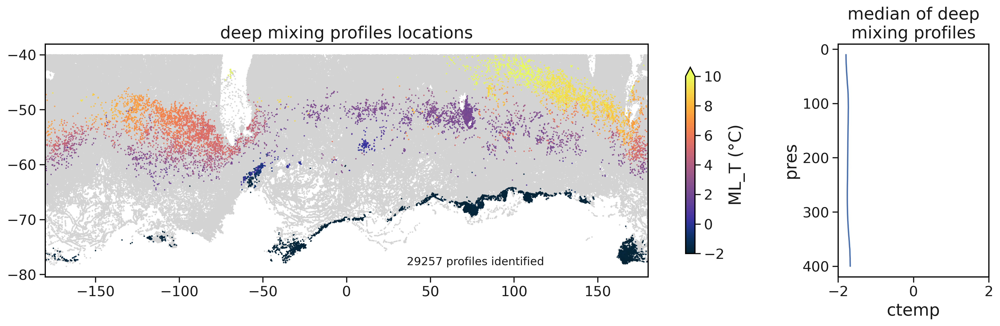

In [7]:
fig,ax = plt.subplots(1,2,figsize=(15,5),width_ratios=[1,0.2],dpi=300)
ax = ax.flatten()

s = 0.25
ax[0].scatter(pct_inv.lon,pct_inv.lat,c='lightgrey',s=s)
hmp = ax[0].scatter(pct_inv[inv_cond].lon,pct_inv[inv_cond].lat,
                    c=ml_t[inv_cond],cmap='cmo.thermal',vmin=-2,vmax=10,s=s)
ax[0].set_title('deep mixing profiles locations',fontsize=18)
ax[0].set_xlim(-180.01,180.01)
ax[0].annotate(text=str(inv_cond.sum().data)+' profiles identified', xy=(0.6,0.05), 
               xycoords='axes fraction', fontsize=12, ha='left')

ds.ctemp.sel(n_prof=pct_inv[inv_cond].n_prof).median('n_prof').plot(y='pres',ax=ax[1])

ax[1].invert_yaxis()
ax[1].set_xlim(-2,2)
ax[1].set_title('median of deep\nmixing profiles',fontsize=18)

fig.colorbar(hmp,ax=ax[0],extend='max',label='ML_T (°C)',aspect=20,shrink=0.8)

fig.tight_layout()

# identify deep convection profile numbers
deep_mx_n_pr = pct_inv[inv_cond].n_prof

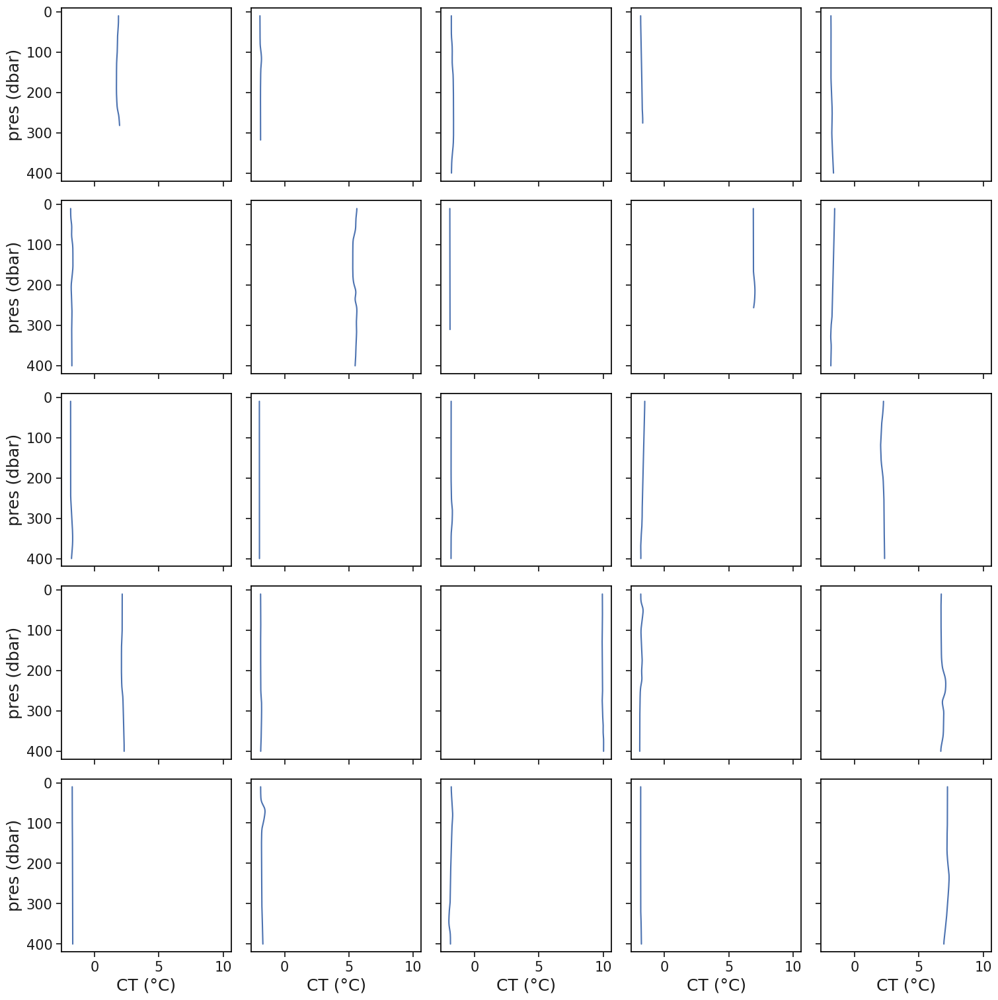

In [8]:
# randomly selected deep mixing profiles

r = 5
fig, ax = plt.subplots(r, r, figsize=(15, 15), sharey=True, sharex=True, )
ax = ax.flatten()

# randomly select some profiles
x = np.asarray(np.random.choice(deep_mx_n_pr, r**2, replace=0))

# Loop over each subplot
for i, l, a in zip(range(len(ax)), x, ax):
    # Plot the original data
    ds.sel(n_prof=l).ctemp.plot(y='pres', ax=a)

    a.invert_yaxis()
    a.set_title('')
    a.set_xlabel('')
    a.set_ylabel('')

# Set global limits for the plots
#plt.xlim(-2, 3)
plt.tight_layout()
#plt.show()

for a in ax[-r:]:
    a.set_xlabel('CT (°C)')

for a in ax[::5]:
    a.set_ylabel('pres (dbar)')

## compute WW_SS

Note: 
$$ ML_T - below_{ml}$$
$$ <0 => ML_T < below_{ml}$$
$$ >0 => ML_T > below_{ml}$$

In [8]:
# compute temperature inversion below the ML 
inversions = ml_t - below_ml

In [9]:
# included in case i want to re-run the following cell
operation_done = False

In [10]:
# remove vertical profiles
if not operation_done:
    inversions = inversions.drop_sel(n_prof=deep_mx_n_pr)
    # Mark the operation as done
    operation_done = True

# count the number of temperature inversions
num_invs = inversions > 0

# remove profiles without a temp inversion
inversions = inversions.where(num_invs.sum('pres',skipna=1)>0,drop=1)
num_invs = update_da(num_invs,inversions)

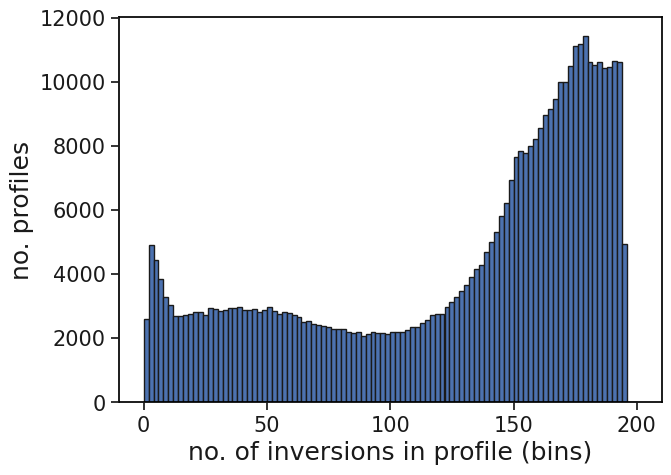

In [11]:
# plot total number of bins with temp below ML_T
num_invs.sum('pres').plot.hist(bins=np.arange(0,201,2),figsize=(7,5))
plt.xlabel('no. of inversions in profile (bins)')
plt.ylabel('no. profiles')
plt.show()

In [12]:
# compute WW_SS core properties
ss_ct = update_da(ds.ctemp,inversions).min('pres')
ss_ct = ss_ct[ss_ct<=2]
ss_cp = update_da(ds.ctemp,ss_ct).idxmin('pres')

# remove profiles with a core deeper than 300 dbar
ss_cp = ss_cp[ss_cp <= 300]
ss_ct = update_da(ss_ct,ss_cp)

# compute upper boundary
idx = np.where(np.isin(ds.n_prof, ss_cp.n_prof))[0] # find index of profiles 
dtdz = ds.ctemp.diff('pres')[idx].where((ds.pres>ds.mlp[idx]) & (ds.pres < ss_cp)).__abs__()
#dtdz = update_da(dtdz,ss_ct)

#dtdz  = ct.diff('pres').__abs__().where(ds.pres>=ds.mlp,drop=1)
#dtdz  = dtdz.where(ds.pres<=ss_cp,drop=1)
#dtdz  = dtdz.where(dtdz.notnull().sum('pres')>0,drop=1)
ss_ub = dtdz.idxmax('pres')

ss_ct = update_da(ss_ct,ss_ub)
ss_cp = update_da(ss_cp,ss_ub)

# check temperature at ub 
# note that the below gives one value per profile and nans all other profile values
# thus we sum here to remove the pres dimension
ub_t = update_da(ct,ss_ub).where(ds.pres==ss_ub,drop=1).sum('pres')
print("number of ss_ub's with ub_t>2: ",(ub_t > 2).sum().data)

##########
# now, ub_t and ss_ub do not have same size. drop any profiles where ss_ub == nan or not even
ss_ub = update_da(ss_ub,ub_t)
ss_cp = update_da(ss_cp,ub_t)

# if <2°C => take 2°C isotherm as ub
# find depth of new upper bound for profs with ub_t > 2
ss_ub[ub_t>2] = (update_da(ct,ub_t[ub_t>2]).where((ct.pres>update_da(ss_ub,ub_t[ub_t>2])) & (ds.pres<ss_cp[ub_t>2])
                        ) - 2).__abs__().idxmin('pres')
# re comp. temp at ub
ub_t = update_da(ct,ss_ub).where(ds.pres==ss_ub,drop=1).sum('pres')

ss_ct = update_da(ss_ct,ub_t)
ss_cp = update_da(ss_cp,ub_t)
ss_ub = update_da(ss_ub,ub_t)

# compute lower boundary
dtdz  = update_da(ct,ss_cp).diff('pres').where(ds.pres>=ss_cp,drop=1)
dtdz  = dtdz.where(dtdz.notnull().sum('pres')>0,drop=1)
ss_lb = dtdz.idxmax('pres')

number of ss_ub's with ub_t>2:  36743


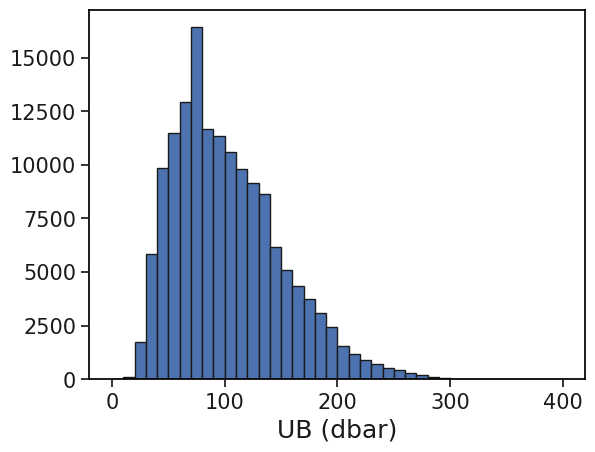

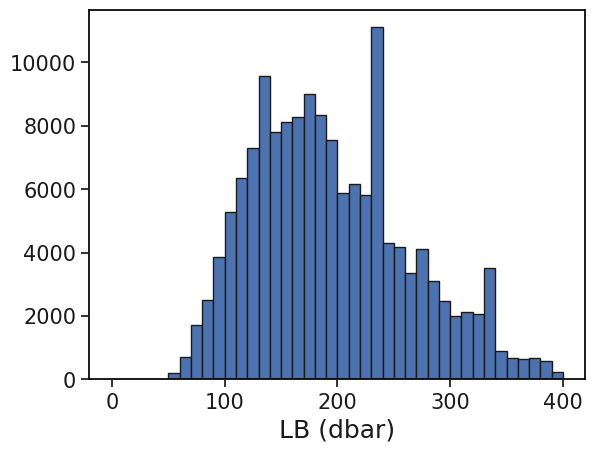

In [13]:
ss_ub.plot.hist(bins=np.arange(0,401,10))
plt.xlabel('UB (dbar)')
plt.show()

ss_lb.plot.hist(bins=np.arange(0,401,10))
plt.xlabel('LB (dbar)')
plt.show()

Text(0.5, 1.0, 'thickness')

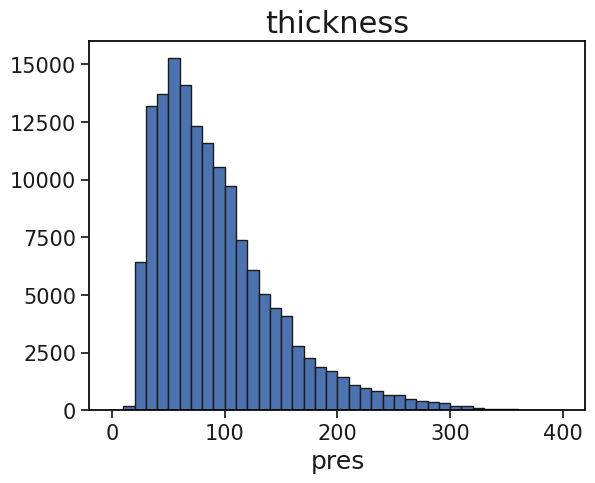

In [17]:
(ss_lb - ss_ub).plot.hist(bins=np.arange(0,401,10))
plt.title('thickness')

note we run a loop bc the vectorised version is taking much longer, for some curious reason that i'm not going to investigate 🤪

In [18]:
# 2 min loop 😴
lb_t = []
for n_pr,p in tqdm(zip(ss_lb.n_prof.data,ss_lb.data)):
    lb_t += ct.sel(n_prof=n_pr,pres=p).data,
lb_t = np.asarray(lb_t)

print("number of ss_lb's with lb_t>2: ",(lb_t > 2).sum())

# recompute temperature for profiles with a lb_t > 2 to the shallower 2°C isotherm
ss_lb[lb_t>2] = (update_da(ct,ss_lb[lb_t>2]).where((ct.pres>update_da(ss_cp,ss_lb[lb_t>2])) & (ct.pres<ss_lb[lb_t>2]))-2).__abs__().idxmin('pres')

# remove nan profiles
lb_t = lb_t[ss_lb.notnull()]
ss_lb = ss_lb.where(ss_lb.notnull(),drop=1)

# recomp lb_t
for i,n_pr,p in tqdm(zip(range((lb_t > 2).sum()),ss_lb[lb_t>2].n_prof.data,ss_lb[lb_t>2].data)):
    lb_t[lb_t>2][i] += ct.sel(n_prof=n_pr,pres=p).data

0it [00:00, ?it/s]

number of ss_lb's with lb_t>2:  12839


0it [00:00, ?it/s]

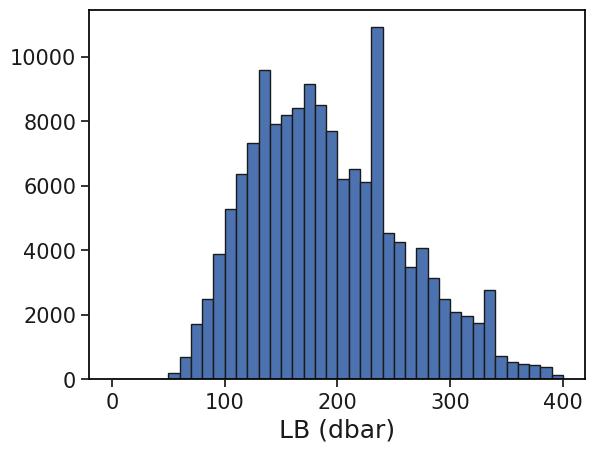

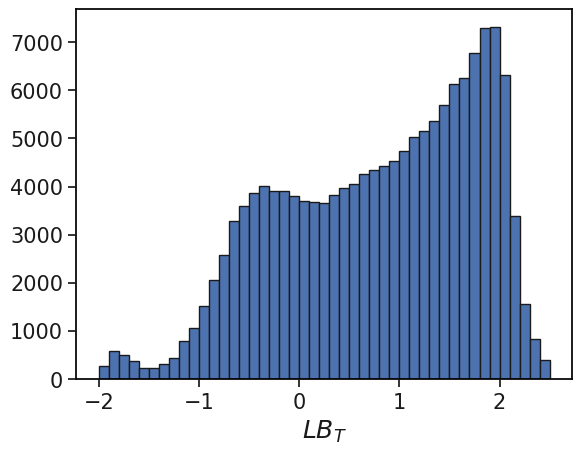

In [20]:
ss_lb.plot.hist(bins=np.arange(0,401,10))
plt.xlabel(r'LB (dbar)')
plt.show()

plt.hist(lb_t,bins=np.arange(-2,2.51,0.1))
plt.xlabel(r'$LB_T$')
plt.show()

In [21]:
# remove profiles that have a lower bound deeper than 300dbar
ss_lb = ss_lb[ss_lb<300]

ss_ct = update_da(ss_ct,ss_lb)
ss_cp = update_da(ss_cp,ss_lb)
ss_ub = update_da(ss_ub,ss_lb)

In [ ]:
# commented out - for some reason, running the lb_t computation is really slow
# even though it's pretty much exactly the same as the above for ss_ub

# check temperature at lb 
# note that the below gives one value per profile and nans all other profile values
# thus we sum here to remove the pres dimension

#lb_t = update_da(ct,ss_lb).where(ds.pres==ss_lb,drop=1).sum('pres')
#print("number of ss_lb's with lb_t>2: ",(lb_t > 2).sum().data)

# if <2°C => take 2°C isotherm between core depth and current lb as new lb
# find depth of new lower bound

#ss_lb[lb_t>2] = update_da(ct,lb_t[lb_t>2]).where(ct.pres>ss_lb[lb_t>2]).__abs__().idxmin('pres')

# re comp. temp at lb

#lb_t = update_da(ct,ss_lb).where(ds.pres==ss_lb,drop=1).sum('pres')

#ss_lb = update_da(ss_ct,lb_t)


#ss_ct = update_da(ss_ct,lb_t)
#ss_cp = update_da(ss_cp,lb_t)
#ss_ub = update_da(ss_ct,lb_t)
#ss_lb = update_da(ss_ct,lb_t)

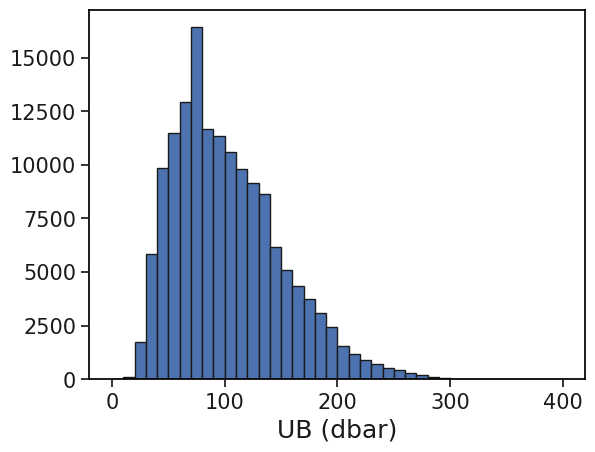

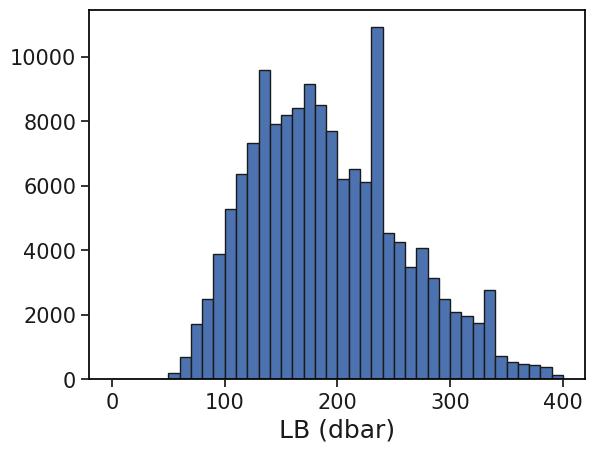

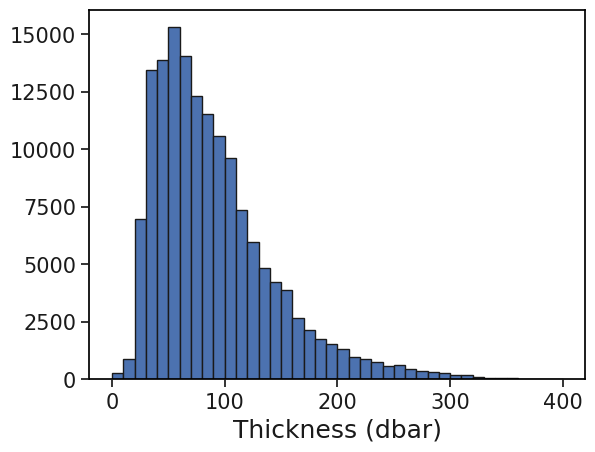

In [19]:
ss_ub.plot.hist(bins=np.arange(0,401,10))
plt.xlabel('UB (dbar)')
plt.show()

ss_lb.plot.hist(bins=np.arange(0,401,10))
plt.xlabel('LB (dbar)')
plt.show()

(ss_lb-ss_ub).plot.hist(bins=np.arange(0,401,10))
plt.xlabel('Thickness (dbar)')
plt.show()

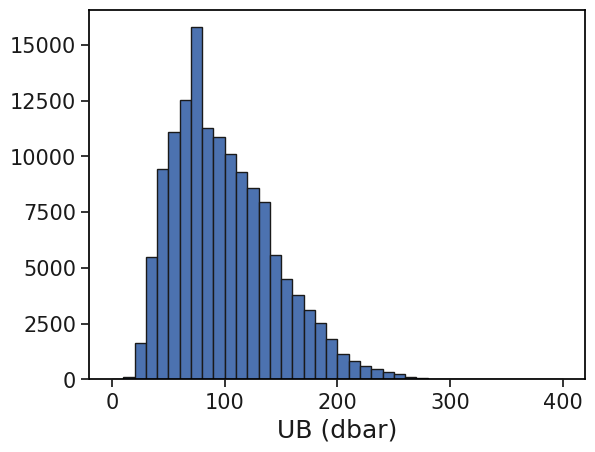

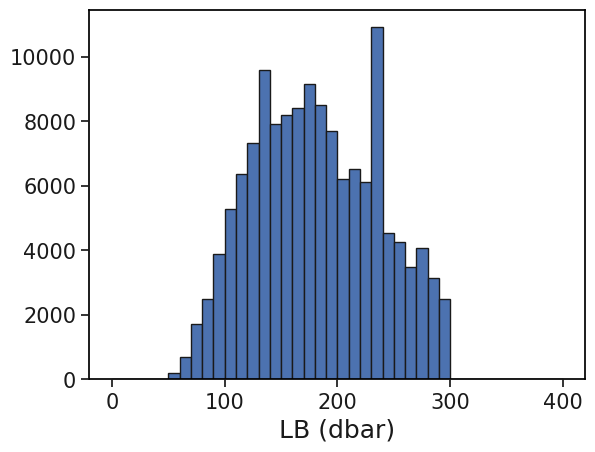

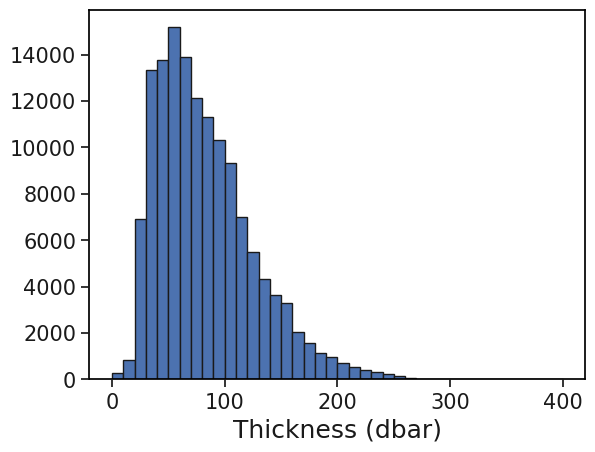

In [22]:
ss_ub.plot.hist(bins=np.arange(0,401,10))
plt.xlabel('UB (dbar)')
plt.show()

ss_lb.plot.hist(bins=np.arange(0,401,10))
plt.xlabel('LB (dbar)')
plt.show()

(ss_lb-ss_ub).plot.hist(bins=np.arange(0,401,10))
plt.xlabel('Thickness (dbar)')
plt.show()

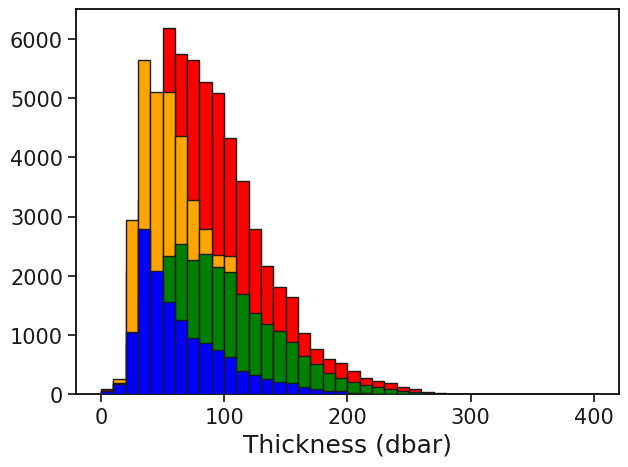

In [39]:
# check how thickness looks
cols = ['red','orange','blue','green'] # summer, autumn, winter, spring

plt.figure(figsize=(7,5))
gr = (ss_lb-ss_ub).groupby_bins('time.month',bins=np.arange(0,15,3),labels=range(0,4,1))
z_ord = [1,2,4,3]
for i in range(4):
    gr[i].plot.hist(bins=np.arange(0,401,10),color=cols[i],linewidth=1,zorder=z_ord[i])
plt.xlabel('Thickness (dbar)')
plt.show()

In [40]:
# check the total number of inversions per profile for SS profiles
tot_invs = update_da(num_invs,ss_ct).sum('pres')

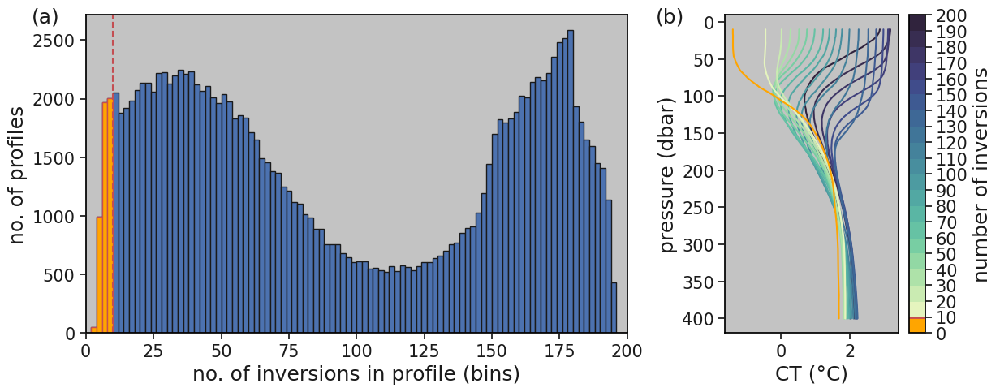

In [41]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors

orange = '#ffa500'
inv_cond = 10 # define inversions condition

fig,ax = plt.subplots(1,2,width_ratios=[1,0.4],figsize=(12.5,5))

tot_invs.plot.hist(bins=np.arange(0,201,2),ax=ax[0])
tot_invs[tot_invs<inv_cond].plot.hist(bins=np.arange(0,201,2),color=orange,edgecolor='r',ax=ax[0])
ax[0].axvline(inv_cond,ls='--',c='r')
ax[0].set_xlabel('no. of inversions in profile (bins)')
ax[0].set_ylabel('no. of profiles')
ax[0].set_xlim(0,200)

# plot second subplot

# Define the colormap
cmap = cm.get_cmap('cmo.deep')

# Create a custom colormap that uses orange for values <= 10 and 'cmo.deep' for values > 10
colors = np.zeros((256, 4))  # RGBA
colors = cmap(np.linspace(0, 1, 256))  # 'cmo.deep' for the rest
cmap = mcolors.LinearSegmentedColormap.from_list('cmo.deep', colors)

# Normalize the index i to a range between 0 and 1
norm_i = lambda i: (i - 10) / (210 - 10)

# Create a list of discrete values from 0 to 200
discrete_values = list(range(0, 201, 10))

for i in range(10, 210, 10):
    # Normalize the index i
    norm_i_val = norm_i(i)
    
    # Get the color from the custom colormap
    color = cmap(norm_i_val)
    
    # Plot the data with the color
    if i <=10:
        color=orange
    line = ds.ctemp.sel(n_prof=tot_invs[(tot_invs >= i - 10) & (tot_invs < i)].n_prof).median('n_prof'
            ).plot(y='pres', color=color, ax=ax[1], zorder=210-i)

    line_color = mcolors.to_rgba(line[0].get_color())
    colors[int((i-10)/200 * 256):int(i/200 * 256)] = line_color

ax[1].invert_yaxis()
ax[1].set_xlabel('CT (°C)')
ax[1].set_ylabel('pressure (dbar)')

# now colorbar
cmap = mcolors.LinearSegmentedColormap.from_list('custom_cmap', colors)
# Create a discrete color bar with the custom colormap
norm = plt.Normalize(vmin=0, vmax=200)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # We don't actually use the array, just the color mapping
sm.set_clim(vmin=0, vmax=200)  # Set the limits to match our data

# Add a color bar to the figure
cb = fig.colorbar(sm, ticks=discrete_values, ax=ax[1], label='number of inversions')

# Calculate the position of the line in normalized colorbar coordinates (assuming the colorbar spans from 0 to 1 vertically)
line_position_normalized = inv_cond / 200  # Normalize the position to the colorbar's range

# Draw a horizontal line on the colorbar at the calculated position
cb.ax.plot([0, 1], [line_position_normalized, line_position_normalized], color='r', linewidth=2, transform=cb.ax.transAxes)

for a,txt in zip(ax,['(a)','(b)']):
    a.set_facecolor('#c3c3c3')

ax[0].annotate(text='(a)', xy=(-0.1,0.975), xycoords='axes fraction', fontsize=18, ha='left')
ax[1].annotate(text='(b)', xy=(-0.4,0.975), xycoords='axes fraction', fontsize=18, ha='left')

fig.tight_layout()

In [42]:
print('total number of profiles with fewer than 10 inversions', (tot_invs<inv_cond).sum().data)

total number of profiles with fewer than 10 inversions 5020


In [43]:
# remove profiles with fewer than 10 inversions
qc_invs = tot_invs[tot_invs>inv_cond]

ss_ct = update_da(ss_ct,qc_invs)
ss_cp = update_da(ss_cp,qc_invs)
ss_ub = update_da(ss_ub,qc_invs)
ss_lb = update_da(ss_lb,qc_invs)

# compute core density
ss_sig = ds.sig.sel(n_prof=ss_cp.n_prof)
ss_sig = ss_sig.where(ss_sig.pres==ss_cp,drop=1).sum('pres')
# compute core salinity
ss_sa = ds.asal.sel(n_prof=ss_cp.n_prof)
ss_sa = ss_sa.where(ss_sa.pres==ss_cp,drop=1).sum('pres')

## add to dataset

In [44]:
# create empty variables to be populated with WW data
ds['up_bd']   = xr.DataArray(np.ndarray(ds.n_prof.size)*np.nan,dims={'n_prof':ds.n_prof.data},coords={'n_prof':ds.n_prof.data})
ds['ww_cp']   = xr.DataArray(np.ndarray(ds.n_prof.size)*np.nan,dims={'n_prof':ds.n_prof.data},coords={'n_prof':ds.n_prof.data})
ds['ww_ct']   = xr.DataArray(np.ndarray(ds.n_prof.size)*np.nan,dims={'n_prof':ds.n_prof.data},coords={'n_prof':ds.n_prof.data})
ds['sig_c']   = xr.DataArray(np.ndarray(ds.n_prof.size)*np.nan,dims={'n_prof':ds.n_prof.data},coords={'n_prof':ds.n_prof.data}) # core density
ds['ww_sa']   = xr.DataArray(np.ndarray(ds.n_prof.size)*np.nan,dims={'n_prof':ds.n_prof.data},coords={'n_prof':ds.n_prof.data})
ds['lw_bd']   = xr.DataArray(np.ndarray(ds.n_prof.size)*np.nan,dims={'n_prof':ds.n_prof.data},coords={'n_prof':ds.n_prof.data})

# these are two do after both WW types have been computed
# classification of WW: surface/mixed layer (ML) or subsurface (SS), 1 and 2 respectively
ds['ww_type'] = xr.DataArray(np.ndarray(ds.n_prof.size)*np.nan,dims={'n_prof':ds.n_prof.data},coords={'n_prof':ds.n_prof.data},
                             attrs  = {'description':'classification of WW: surface (ML) or subsurface, 1 and 2 respectively'},)
ds['thcc']    = xr.DataArray(np.ndarray(ds.n_prof.size)*np.nan,dims={'n_prof':ds.n_prof.data},coords={'n_prof':ds.n_prof.data})
ds['ww_n2']   = xr.DataArray(np.ndarray(ds.n_prof.size)*np.nan,dims={'n_prof':ds.n_prof.data},coords={'n_prof':ds.n_prof.data})

In [45]:
# identify where the WW_SS are in the main ds
idx = np.where(np.isin(ds.n_prof, ss_ct.n_prof))[0]

# add WW_SS data to dataset
ds['up_bd'][idx] = ss_ub.data
ds['ww_cp'][idx] = ss_cp.data
ds['ww_ct'][idx] = ss_ct.data
ds['sig_c'][idx] = ss_sig.data
ds['ww_sa'][idx] = ss_sa.data
ds['lw_bd'][idx] = ss_lb.data
ds['ww_type'][idx] = 2

## now compute WW_ML winter water

In [46]:
# remove any profiles identified as deep mixing and any WW_SS profiles
ds_ml = ds[['ctemp','asal','sig','mlp']].drop_sel(n_prof=np.append(deep_mx_n_pr,ss_ct.n_prof.data))
%time ds_ml = ds_ml[['ctemp','asal','sig',]].where(ds_ml.pres < ds_ml.mlp,drop=1).mean('pres')

CPU times: user 1min 9s, sys: 560 ms, total: 1min 9s
Wall time: 1min 9s


In [47]:
print('current ML WW no. profiles', (ds_ml.ctemp<2).sum().data)

current ML WW no. profiles 107986


In [48]:
# only ww_ml if ML_T < 2°C
%time ds_ml = ds_ml.where(ds_ml.ctemp<2,drop=1)

CPU times: user 18.7 ms, sys: 0 ns, total: 18.7 ms
Wall time: 18.6 ms


(array([0.0000e+00, 2.0000e+00, 7.0000e+00, 2.4000e+01, 7.7000e+01,
        1.5400e+02, 2.3800e+02, 5.0500e+02, 8.5300e+02, 1.9160e+03,
        6.5450e+03, 1.7974e+04, 2.2552e+04, 2.3968e+04, 1.7625e+04,
        8.9210e+03, 4.5030e+03, 1.9750e+03, 1.1400e+02, 2.5000e+01,
        2.0000e+00]),
 array([26. , 26.1, 26.2, 26.3, 26.4, 26.5, 26.6, 26.7, 26.8, 26.9, 27. ,
        27.1, 27.2, 27.3, 27.4, 27.5, 27.6, 27.7, 27.8, 27.9, 28. , 28.1]),
 <BarContainer object of 21 artists>)

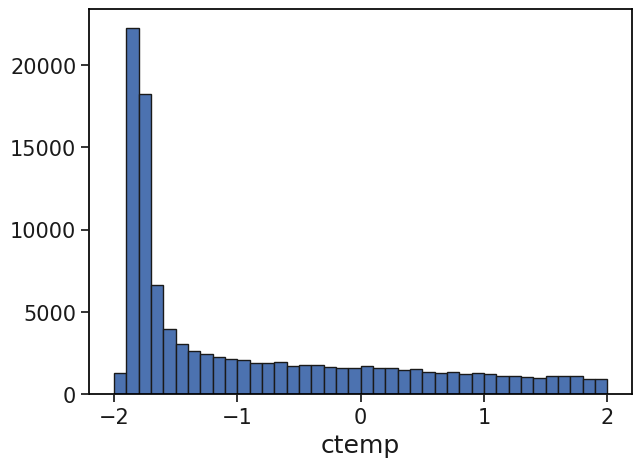

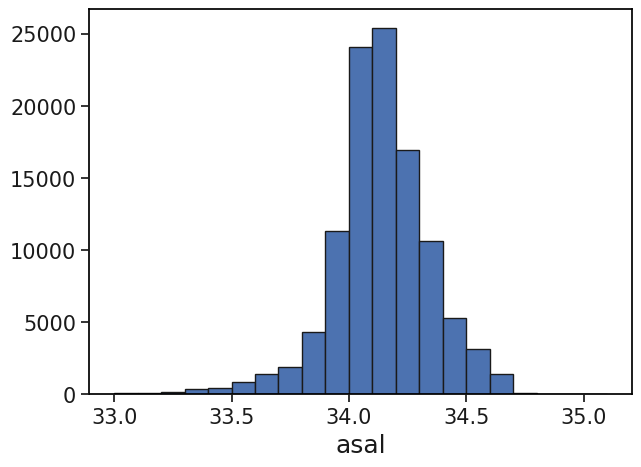

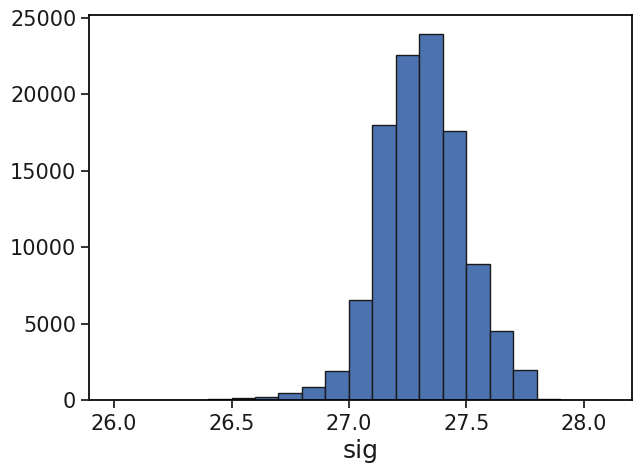

In [49]:
ds_ml.ctemp.plot.hist(bins=np.arange(-2,2.1,0.1),figsize=(7,5))
ds_ml.asal.plot.hist(bins=np.arange(33,35.1,0.1),figsize=(7,5))
ds_ml.sig.plot.hist(bins=np.arange(26,28.1,0.1),figsize=(7,5))

In [50]:
# identify where the WW_ML are in the main ds
idx = np.where(np.isin(ds.n_prof, ds_ml.n_prof))[0]
# locate WW_ML mld
mlp = ds.mlp[idx]

# add WW_SS data to dataset
ds['up_bd'][idx] = 0
ds['ww_cp'][idx] = (mlp/2).data
ds['ww_ct'][idx] = ds_ml.ctemp.data
ds['sig_c'][idx] = ds_ml.sig.data
ds['ww_sa'][idx] = ds_ml.asal.data
ds['lw_bd'][idx] = mlp.data
ds['ww_type'][idx] = 1

## final computations for variables that have same method for both WW types:

In [51]:
# compute n2
n2 = ds.n2.where((ds.pres>ds.up_bd) & (ds.pres<ds.lw_bd)).sum('pres')
ds['ww_n2'][n2!=0] = n2[n2!=0]

# compute thickness
ds['thcc'] = ds.lw_bd - ds.up_bd

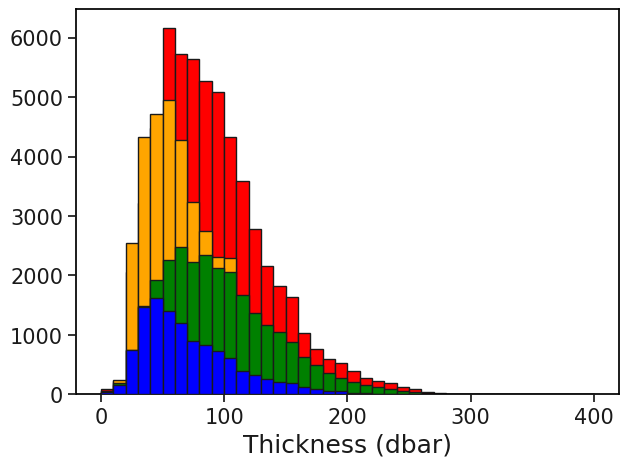

In [53]:
# check how thickness looks
cols = ['red','orange','blue','green'] # summer, autumn, winter, spring

plt.figure(figsize=(7,5))
gr = ds.thcc.where(ds.ww_type==2).groupby_bins('time.month',bins=np.arange(0,15,3),labels=range(0,4,1))
z_ord = [1,2,4,3]
for i in range(4):
    gr[i].plot.hist(bins=np.arange(0,401,10),color=cols[i],linewidth=1,zorder=z_ord[i])
plt.xlabel('Thickness (dbar)')
plt.show()

In [56]:
ww_vars = ['up_bd', 'ww_cp', 'ww_ct', 'sig_c', 'ww_sa', 'lw_bd', 'ww_type', 'ww_n2', 'thcc']
ds[ww_vars].isel(n_prof=np.where(ds.ww_type.notnull())[0]
                ).to_netcdf('/home/theospira/notebooks/projects/WW_climatology/data/hydrographic_profiles/submission2/ww_only_hydrographic_data.nc')

In [55]:
print('total WW_ML profiles ', (ds.ww_type==1).sum().data, '('
      ,np.round(((ds.ww_type==1).sum()/ds.ww_type.notnull().sum()).data*100,2),'%)')
print('total WW_SS profiles ', (ds.ww_type==2).sum().data,'(',
      np.round(((ds.ww_type==2).sum()/ds.ww_type.notnull().sum()).data*100,2),'%)')
print('total WW_ profiles ', (ds.ww_type.notnull()).sum().data)

total WW_ML profiles  107986 ( 44.79 %)
total WW_SS profiles  133129 ( 55.21 %)
total WW_ profiles  241115


## check some plots

In [33]:
gr_t = ds.ww_type[ds.ww_type.notnull()].groupby('time.month')

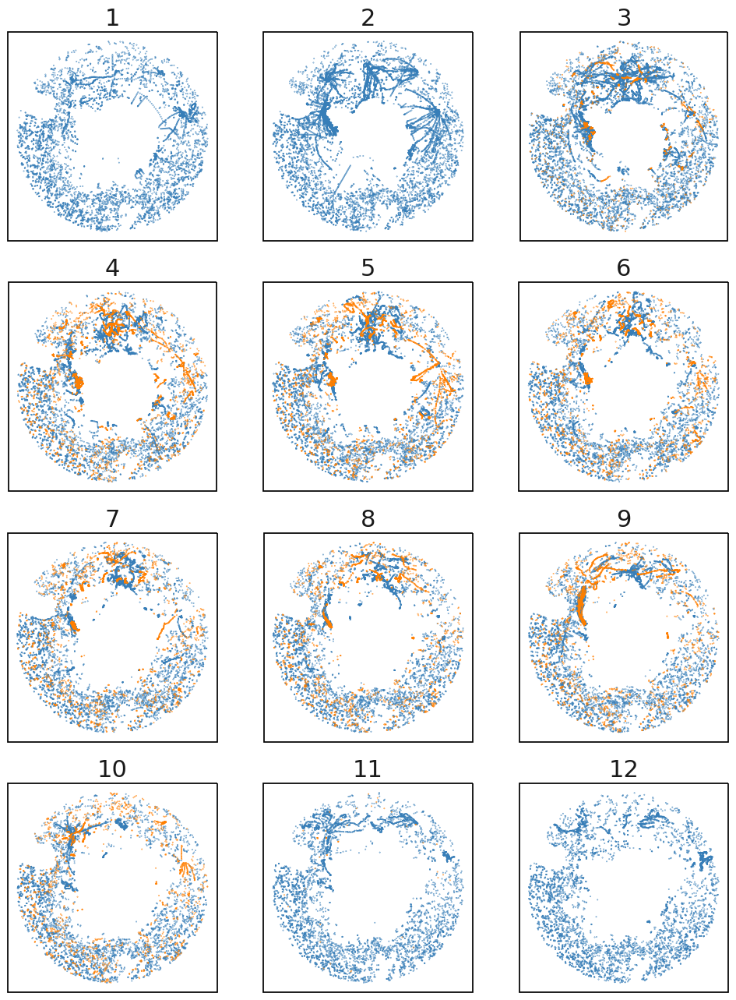

In [35]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.colors as mpl_colors

# Assuming gr_t is already defined elsewhere in your code
# Define the colormap
cm = mpl_colors.LinearSegmentedColormap.from_list("", ['#377eb8', '#ff7f00'])

fig, ax = plt.subplots(4, 3, figsize=(12, 16), subplot_kw={'projection': ccrs.SouthPolarStereo()})
ax = ax.flatten()

for i, m in enumerate(list(gr_t.groups.keys())):
    # Normalize the data to [0, 1] assuming values are 1 and 2
    normalized_data = (gr_t[m] - 1) / (2 - 1)
    
    # Apply the colormap to the normalized data
    colors = cm(normalized_data)
    
    ax[i].scatter(x=gr_t[m].lon, y=gr_t[m].lat, c=colors, transform=ccrs.PlateCarree(), s=0.1)
    ax[i].set_title(m)

plt.show()


In [98]:
%time ww_type = grid_var_3d_mode(ds,'ww_type')

CPU times: user 13.2 s, sys: 3.98 ms, total: 13.2 s
Wall time: 13.2 s


In [110]:
ww_type

<xarray.DataArray (time: 4, lon: 360, lat: 39)>
array([[[nan,  1., nan, ..., nan, nan, nan],
        [nan, nan,  1., ..., nan, nan, nan],
        [nan, nan,  1., ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan,  1.,  1., ..., nan, nan, nan],
        [nan,  1.,  1., ..., nan, nan, nan]],

       [[nan,  1., nan, ..., nan, nan, nan],
        [nan,  1., nan, ..., nan, nan, nan],
        [nan,  1.,  1., ..., nan, nan, nan],
        ...,
        [nan, nan,  1., ..., nan, nan, nan],
        [nan,  1., nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan,  1., ..., nan, nan, nan],
        [nan, nan,  1., ..., nan, nan, nan],
        ...,
        [nan, nan,  1., ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan,  1., ..., nan, nan, nan],
        [nan, nan,  1., ..., nan, nan, nan],
        [nan, nan,  1., ..., nan, nan, nan]]])
Coordinates:
  * time     (time) float64 1.5 4.5 7.5 10.5
  * lon      (lon) float64 -179.5 -178.5 -177.5 -176.5 ... 177.5 178.5 179.5
  * lat      (lat) float64 -78.5 -77.5 -76.5 -75.5 ... -43.5 -42.5 -41.5 -40.5

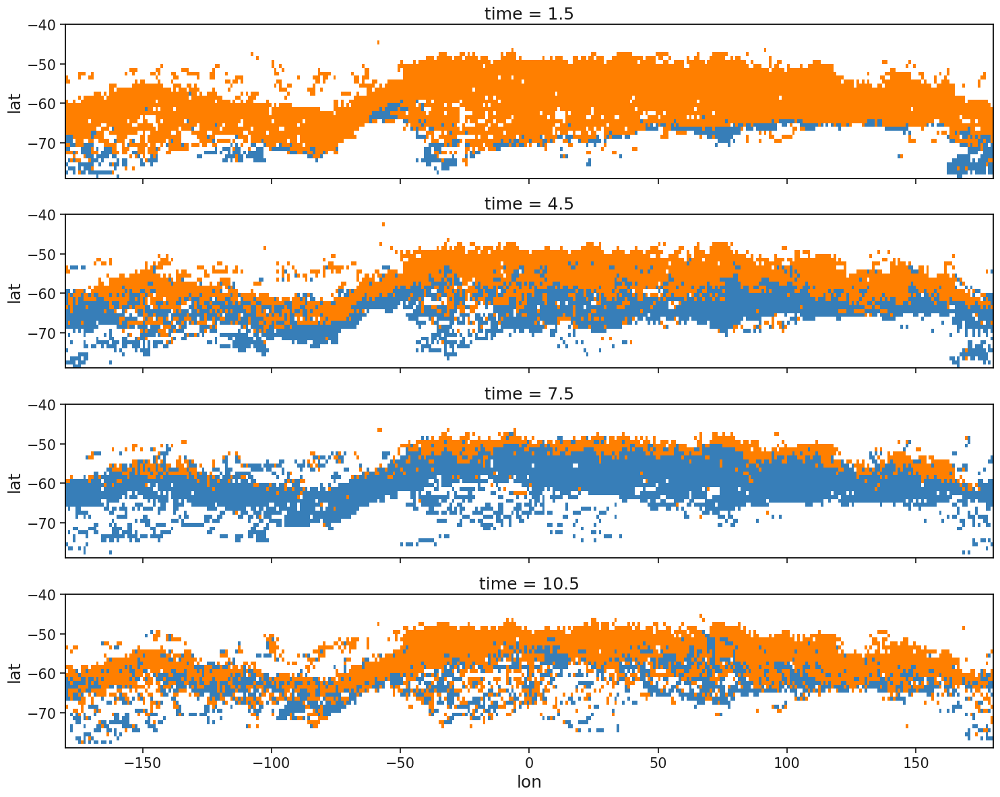

In [99]:
ww_type.plot(row='time',x='lon',y='lat',cmap=cm,levels=3,vmin=0,vmax=3,add_colorbar=False,
            figsize=(15,12))

In [100]:
gr_ss = ss_ct.groupby('time.month')
gr_ml = ds_ml.ctemp.groupby('time.month')

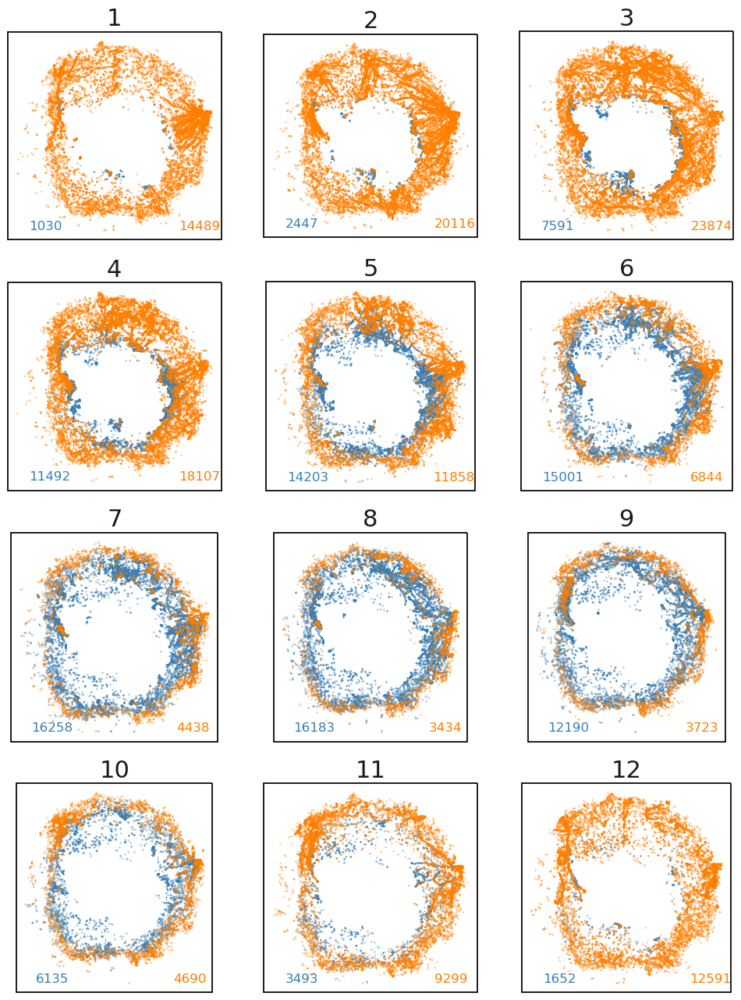

In [101]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.colors as mpl_colors

# Assuming gr_t is already defined elsewhere in your code
# Define the colormap
cm = mpl_colors.LinearSegmentedColormap.from_list("", ['#377eb8', '#ff7f00'])

fig, ax = plt.subplots(4, 3, figsize=(12, 16), subplot_kw={'projection': ccrs.SouthPolarStereo()})
ax = ax.flatten()

for i, m in enumerate(list(gr_ml.groups.keys())):        
    ax[i].scatter(x=gr_ml[m].lon, y=gr_ml[m].lat, c='#377eb8', transform=ccrs.PlateCarree(), s=0.1,zorder=0)
    ax[i].annotate(text=str(gr_ml[m].n_prof.size), xy=(0.1,0.05), c='#377eb8',
               xycoords='axes fraction', fontsize=12, ha='left')
    
    ax[i].scatter(x=gr_ss[m].lon, y=gr_ss[m].lat, c='#ff7f00', transform=ccrs.PlateCarree(), s=0.1,zorder=1)
    ax[i].annotate(text=str(gr_ss[m].n_prof.size), xy=(0.8,0.05), c='#ff7f00',
               xycoords='axes fraction', fontsize=12, ha='left')
    
    ax[i].set_title(m)
plt.show()

In [95]:
(ds.ww_type==1).sum().data,(ds.ww_type==2).sum().data

(array(107675), array(133463))

# compare old vs new algorithm results: particularly thickness

In [2]:
ds = xr.open_dataset('/home/theospira/notebooks/projects/WW_climatology/data/hydrographic_profiles/superseded/ww_gauss_smoothed_ds-preDec23.nc')
ds_ww = xr.open_dataset('/home/theospira/notebooks/projects/WW_climatology/data/hydrographic_profiles/submission2/ww_only_hydrographic_data.nc')

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mode

def plot_hist_thcc(ax, gr_ss, gr_ml, app_=None, x=4, stat='all', add_legend=0):
    cols = ['#e41a1c', '#dede00', '#377eb8', '#4daf4a']
    szns = ['Summer', 'Autumn', 'Winter', 'Spring']
    x = 4
    bins = np.arange(0, 400 + x, x)
    y_annotate = 0.5
    
    # compute z_order by first computing their total area under the curve, then sorting them
    #z_ss = np.argsort([np.sum(gr_ss[i].notnull()) for i in range(4)])[::-1]
    #z_ml = np.argsort([np.sum(gr_ml[i].notnull()) for i in range(4)])[::-1]

    z_ml = [2,0,1,3]
    z_ss = [0,1,3,2]
    
    for i in range(4):
        ax[0].hist(gr_ml[i], bins=bins, label=szns[i], alpha=0.4, color=cols[i], lw=0.5, zorder=z_ml[i])
        ax[1].hist(gr_ss[i], bins=bins, label=szns[i], alpha=0.4, color=cols[i], lw=0.5, zorder=z_ss[i])
        if app_ is None:
            app = np.append(gr_ss[i].data, gr_ml[i].data)
        else:
            app = app_[i]
        ax[2].hist(app, bins=bins, label=szns[i], alpha=0.4, color=cols[i], lw=0.5)

        #if stat == 'all':
        for a, g in zip(ax, [gr_ml[i].data, gr_ss[i].data, app]):
            if stat == 'median':
                a.annotate(text=szns[i][:3] + ': ' + str(int(np.nanmedian(g))), xy=(0.7, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
            if stat == 'mean':
                a.annotate(text=szns[i][:3] + ': ' + str(int(np.nanmean(g))), xy=(0.7, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
            if stat == 'mode':
                a.annotate(text=szns[i][:3] + ': ' + str(int(mode(g, nan_policy='omit').mode)), xy=(0.7, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
            if stat == 'all':
                # first, label season
                a.annotate(text=szns[i][:3] + ': ', xy=(0.65, y_annotate), xycoords='axes fraction', fontsize=12, ha='right')
                # median
                a.annotate(text=str(int(np.nanmedian(g))), xy=(0.7, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
                # mean
                a.annotate(text=str(int(np.nanmean(g))), xy=(0.8, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
                # mode
                a.annotate(text=str(int(mode(g[g > 0], nan_policy='omit').mode)), xy=(0.9, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
            y_annotate = y_annotate - 0.02
    
    if stat == 'all':
        for a in ax:
            a.annotate(text='median', xy=(0.675, 0.5 + 0.08), xycoords='axes fraction', fontsize=12, ha='center')
            a.annotate(text='mean', xy=(0.8, 0.5 + 0.08), xycoords='axes fraction', fontsize=12, ha='center')
            a.annotate(text='mode', xy=(0.9, 0.5 + 0.08), xycoords='axes fraction', fontsize=12, ha='center')
    elif stat is not None:
        for a in ax:
            a.annotate(text=stat + ':', xy=(0.75, 0.5 + 0.08), xycoords='axes fraction', fontsize=12, ha='center')

    ax[0].set_xlabel('WW_ML thickness (dbar)', fontsize=18)
    ax[1].set_xlabel('WW_SS thickness (dbar)', fontsize=18)
    ax[2].set_xlabel('Both WW types thickness (dbar)', fontsize=18)
    
    ax[0].set_xlim(0, 300)

    if add_legend:
        ax[0].legend()

In [4]:
gr_ml_old = ds.thcc.isel(n_prof=np.where(ds.ww_type==1)[0]).groupby_bins('time.month',bins=np.arange(0,15,3),labels=range(0,4,1))
gr_ss_old = ds.thcc.isel(n_prof=np.where(ds.ww_type==2)[0]).groupby_bins('time.month',bins=np.arange(0,15,3),labels=range(0,4,1))

gr_ml_new = ds_ww.thcc.isel(n_prof=np.where(ds_ww.ww_type==1)[0]).groupby_bins('time.month',bins=np.arange(0,15,3),labels=range(0,4,1))
gr_ss_new = ds_ww.thcc.isel(n_prof=np.where(ds_ww.ww_type==2)[0]).groupby_bins('time.month',bins=np.arange(0,15,3),labels=range(0,4,1))

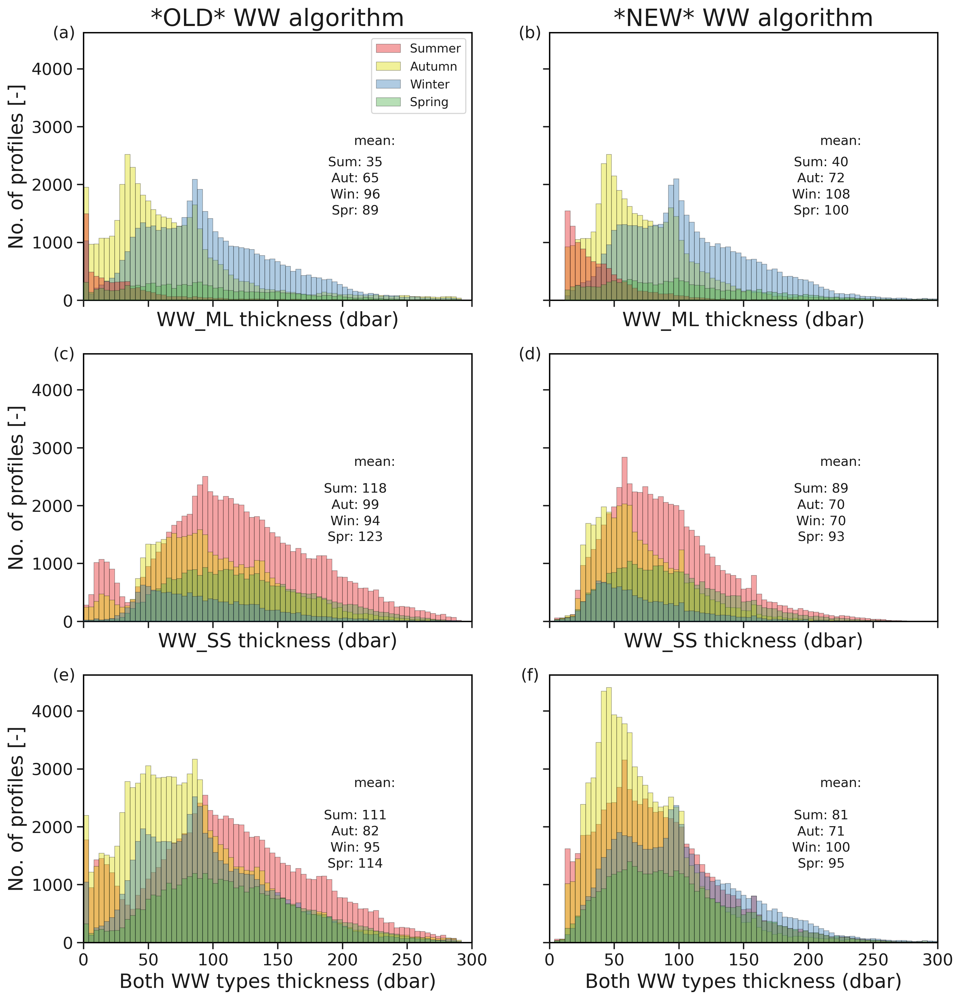

In [9]:
fig,ax = plt.subplots(3,2,figsize=(14,15),sharex=1,sharey=1,dpi=300)
ax = ax.flatten()

# plot old data
plot_hist_thcc(ax=ax[::2],gr_ss=gr_ss_old,gr_ml=gr_ml_old,add_legend=1,stat='mean')

# plot new data
plot_hist_thcc(ax=ax[1::2],gr_ss=gr_ss_new,gr_ml=gr_ml_new,stat='mean')

# Generate alphabetical labels
labels = [chr(i) for i in range(ord('a'), ord('f')+1)]
for i,a in enumerate(ax):
    a.annotate(text='('+labels[i]+')', xy=(-0.05, 0.98), xycoords='axes fraction', fontsize=15, ha='center')

ax[0].set_title('*OLD* WW algorithm')
ax[1].set_title('*NEW* WW algorithm')

for a in ax[::2]:
    a.set_ylabel('No. of profiles [-]',fontsize=18)

# gridding

In [68]:
def grid_var_3d(ds,var):
    "function courtest of Vincent Doriot"
    df = ds[var].to_dataframe()
    #df = df.rename(columns={"LONGITUDE":"longitude","LATITUDE":"latitude"})
    
    lat_bins = np.arange(np.floor(df.lat.min()),np.ceil(df.lat.max())+1,1)
    lon_bins = np.arange(np.floor(df.lon.min()),np.ceil(df.lon.max())+1,1)
    ### Cut containing pandas intervals lon/lat/time
    cut_lat_label = pd.cut(df["lat"],lat_bins)
    cut_lon_label = pd.cut(df["lon"],lon_bins)
    bins_dt = np.arange(0,15,3)
    bins_str = bins_dt.astype(str)
    cut_time_label = pd.cut(df['time'].dt.month, bins=bins_dt)
    cut_time_label.dropna()
    df_cut_label = df.drop(["lat","lon","time"],axis=1)
    df_cut_label = df_cut_label.groupby([cut_time_label,cut_lon_label,cut_lat_label]).median()
    
    lat_mid = (pd.IntervalIndex(df_cut_label.index.get_level_values('lat')).mid).unique()
    lon_mid = (pd.IntervalIndex(df_cut_label.index.get_level_values('lon')).mid).unique()
    time_mid = (pd.IntervalIndex(df_cut_label.index.get_level_values('time')).mid).unique()
    
    df_cut_label.index = df_cut_label.index.set_levels(time_mid.values,level=0)
    df_cut_label.index = df_cut_label.index.set_levels(lon_mid,level=1)
    df_cut_label.index = df_cut_label.index.set_levels(lat_mid.values,level=2)
    
    df_cut = df_cut_label.copy()
    df_cut.replace(0,np.nan,inplace=True)
    ds_cut = df_cut.to_xarray()
    ds_cut["lat"] = sorted(lat_mid)
    ds_cut["lon"] = sorted(lon_mid)
    ds_cut["time"] = time_mid

    return ds_cut

from scipy.stats import mode

# Define a function to apply that extracts only the mode
def get_mode(series):
    return series.mode[0]

def grid_var_3d_mode(ds,var):
    "original function courtest of Vincent Doriot. Adapted by TS."
    df = ds[var].to_dataframe()
    #df = df.rename(columns={"LONGITUDE":"longitude","LATITUDE":"latitude"})
    
    lat_bins = np.arange(np.floor(df.lat.min()),np.ceil(df.lat.max())+1,1)
    lon_bins = np.arange(np.floor(df.lon.min()),np.ceil(df.lon.max())+1,1)
    ### Cut containing pandas intervals lon/lat/time
    cut_lat_label = pd.cut(df["lat"],lat_bins)
    cut_lon_label = pd.cut(df["lon"],lon_bins)
    bins_dt = np.arange(0,15,3)
    bins_str = bins_dt.astype(str)
    cut_time_label = pd.cut(df['time'].dt.month, bins=bins_dt)
    cut_time_label.dropna()
    df_cut_label = df.drop(["lat","lon","time"],axis=1)
    df_cut_label = df_cut_label.groupby([cut_time_label,cut_lon_label,cut_lat_label]
                                       ).apply(mode,nan_policy='omit').transform(get_mode)
    
    lat_mid = (pd.IntervalIndex(df_cut_label.index.get_level_values('lat')).mid).unique()
    lon_mid = (pd.IntervalIndex(df_cut_label.index.get_level_values('lon')).mid).unique()
    time_mid = (pd.IntervalIndex(df_cut_label.index.get_level_values('time')).mid).unique()
    
    df_cut_label.index = df_cut_label.index.set_levels(time_mid.values,level=0)
    df_cut_label.index = df_cut_label.index.set_levels(lon_mid,level=1)
    df_cut_label.index = df_cut_label.index.set_levels(lat_mid.values,level=2)
    
    df_cut = df_cut_label.copy()
    df_cut.replace(0,np.nan,inplace=True)
    ds_cut = df_cut.to_xarray()
    ds_cut["lat"] = sorted(lat_mid)
    ds_cut["lon"] = sorted(lon_mid)
    ds_cut["time"] = time_mid

    return ds_cut

def grid_var_3d_sum(ds,var):
    "original function courtest of Vincent Doriot. Adapted by TS."
    df = ds[var].to_dataframe()
    #df = df.rename(columns={"LONGITUDE":"longitude","LATITUDE":"latitude"})
    
    lat_bins = np.arange(np.floor(df.lat.min()),np.ceil(df.lat.max())+1,1)
    lon_bins = np.arange(np.floor(df.lon.min()),np.ceil(df.lon.max())+1,1)
    ### Cut containing pandas intervals lon/lat/time
    cut_lat_label = pd.cut(df["lat"],lat_bins)
    cut_lon_label = pd.cut(df["lon"],lon_bins)
    bins_dt = np.arange(0,15,3)
    bins_str = bins_dt.astype(str)
    cut_time_label = pd.cut(df['time'].dt.month, bins=bins_dt)
    cut_time_label.dropna()
    df_cut_label = df.drop(["lat","lon","time"],axis=1)
    df_cut_label = df_cut_label.groupby([cut_time_label,cut_lon_label,cut_lat_label]).sum()
    
    lat_mid = (pd.IntervalIndex(df_cut_label.index.get_level_values('lat')).mid).unique()
    lon_mid = (pd.IntervalIndex(df_cut_label.index.get_level_values('lon')).mid).unique()
    time_mid = (pd.IntervalIndex(df_cut_label.index.get_level_values('time')).mid).unique()
    
    df_cut_label.index = df_cut_label.index.set_levels(time_mid.values,level=0)
    df_cut_label.index = df_cut_label.index.set_levels(lon_mid,level=1)
    df_cut_label.index = df_cut_label.index.set_levels(lat_mid.values,level=2)
    
    df_cut = df_cut_label.copy()
    df_cut.replace(0,np.nan,inplace=True)
    ds_cut = df_cut.to_xarray()
    ds_cut["lat"] = sorted(lat_mid)
    ds_cut["lon"] = sorted(lon_mid)
    ds_cut["time"] = time_mid

    return ds_cut

In [69]:
from scipy.stats import mode

def count_gridding_szn(dsvar):
    
    # define lon min and max resp
    gs = 1
    lon_min = -180
    lon_max = 180
    lon = np.arange(lon_min,lon_max+gs,gs)
    lon_labels = range(0,lon_max-lon_min,gs)
    
    lat_min = np.floor(ds.lat.min().data).astype(int)
    lat_max = np.ceil(ds.lat.max().data).astype(int)
    lat = np.arange(lat_min,lat_max+gs,gs)
    lat_labels = range(0,lat_max-lat_min,gs)

    # create empty array to populate
    arr = np.ndarray([4,360,len(lat_labels)])*np.nan
    
    # group by seasons
    var = dsvar.groupby_bins(group='time.month',bins=range(0,15,3),labels=range(0,4))
    
    # group into lon bins
    for t,gr_t in tqdm(var):
        var1 = gr_t.groupby_bins('lon',lon,labels=lon_labels,restore_coord_dims=True)
        
        # now group into lat bins for each lon group:
        for ln,gr_ln in var1:
            var2 = gr_ln.groupby_bins('lat',lat,labels=lat_labels,restore_coord_dims=True)
            
            # now take the mode!
            for lt,gr_lt in var2:
                arr[t,ln,lt] = gr_lt.count()
            
    return arr

In [70]:
from scipy.stats import mode

def mode_gridding_szn(dsvar):
    
    # define lon min and max resp
    gs = 1
    lon_min = -180
    lon_max = 180
    lon = np.arange(lon_min,lon_max+gs,gs)
    lon_labels = range(0,lon_max-lon_min,gs)
    
    lat_min = np.floor(ds.lat.min().data).astype(int)
    lat_max = np.ceil(ds.lat.max().data).astype(int)
    lat = np.arange(lat_min,lat_max+gs,gs)
    lat_labels = range(0,lat_max-lat_min,gs)

    # create empty array to populate
    if 'pres' in dsvar.dims:
        arr = np.ndarray([4,360,len(lat_labels),ds.pres.size])*np.nan
    else:
        arr = np.ndarray([4,360,len(lat_labels)])*np.nan
    
    # group by seasons
    var = dsvar.groupby_bins(group='time.month',bins=range(0,15,3),labels=range(0,4))
    
    # group into lon bins
    for t,gr_t in tqdm(var):
        var1 = gr_t.groupby_bins('lon',lon,labels=lon_labels,restore_coord_dims=True)
        
        # now group into lat bins for each lon group:
        for ln,gr_ln in var1:
            var2 = gr_ln.groupby_bins('lat',lat,labels=lat_labels,restore_coord_dims=True)
            
            # now take the mode!
            for lt,gr_lt in var2:
                arr[t,ln,lt] = mode(gr_lt,nan_policy='omit')[0]
            
    return arr

In [11]:
ds = xr.open_dataset('/home/theospira/notebooks/projects/WW_climatology/data/hydrographic_profiles/submission2/ww_only_hydrographic_data.nc')

In [15]:
print('ML WW: ',(ds.ww_type==1).sum().data)
print('SS WW: ',(ds.ww_type==2).sum().data)
print('Total WW: ',(ds.ww_type.notnull()).sum().data)
print('Total WW: ',(ds.ww_type.notnull()).sum().data/620293 * 100)

ML WW:  107986
SS WW:  133129
Total WW:  241115
Total WW:  38.871146377598976


In [13]:
print('ML WW: ',(ds.ww_type==1).sum().data)
print('SS WW: ',(ds.ww_type==2).sum().data)

ML WW:  107986
SS WW:  133129


In [ ]:
del(ds1)# = xr.open_dataset('/home/theospira/notebooks/projects/WW_climatology/data/hydrographic_profiles/superseded/ww_gauss_smoothed_ds-preDec23.nc')

In [ ]:
ww_vars = ['up_bd', 'ww_cp', 'ww_ct', 'sig_c', 'ww_sa', 'lw_bd', 'ww_type', 'ww_n2', 'thcc']

ww_gridded = []
# all other variables are computed as median:
ww_vars = np.asarray(ww_vars)
for v in tqdm(ww_vars[np.where(ww_vars!='ww_type')[0]]):
    ww_gridded += grid_var_3d(ds,v),

# create dataset based on gridded ww data
# note that mode gridding, for some reason, outputs a DataArray and not a Dataset
ds_ww = xr.merge(ww_gridded)

# compute mode ww_type for each grid cell
ww_type = mode_gridding_szn(ds['ww_type'])
ds_ww['ww_type'] = xr.DataArray(ww_type,dims={'time':ds_ww.time,'lon':ds_ww.lon,'lat':ds_ww.lat})

# compute total number of profiles containing ww per gridcell
ww_prof = count_gridding_szn(ds['n_prof'])
ds_ww['ww_prof'] = xr.DataArray(ww_prof,dims={'time':ds_ww.time,'lon':ds_ww.lon,'lat':ds_ww.lat})

ds_ww.ww_prof.attrs['description'] = 'total number of profiles across the time span for that month containing Winter Water.'
ds_ww.ww_type.attrs['description'] = 'mode of ww classification per grid cell. key: 1:ML WW, 2:Subsurface WW'


ds_ww['time'] = [2,3,0,1]
ds_ww = ds_ww.sortby('time')
ds_ww.time.attrs['description'] = 'Seasons: 0:Winter, 1:Spring, 2:Summer, 3:Autumn'

ds_ww.to_netcdf('/home/theospira/notebooks/projects/WW_climatology/data/hydrographic_profiles/submission2/ww_gridded_climatology.nc')

# plotting - checking 

In [3]:
ds_ww = xr.open_dataset('/home/theospira/notebooks/projects/WW_climatology/data/hydrographic_profiles/ww_gridded_climatology.nc')

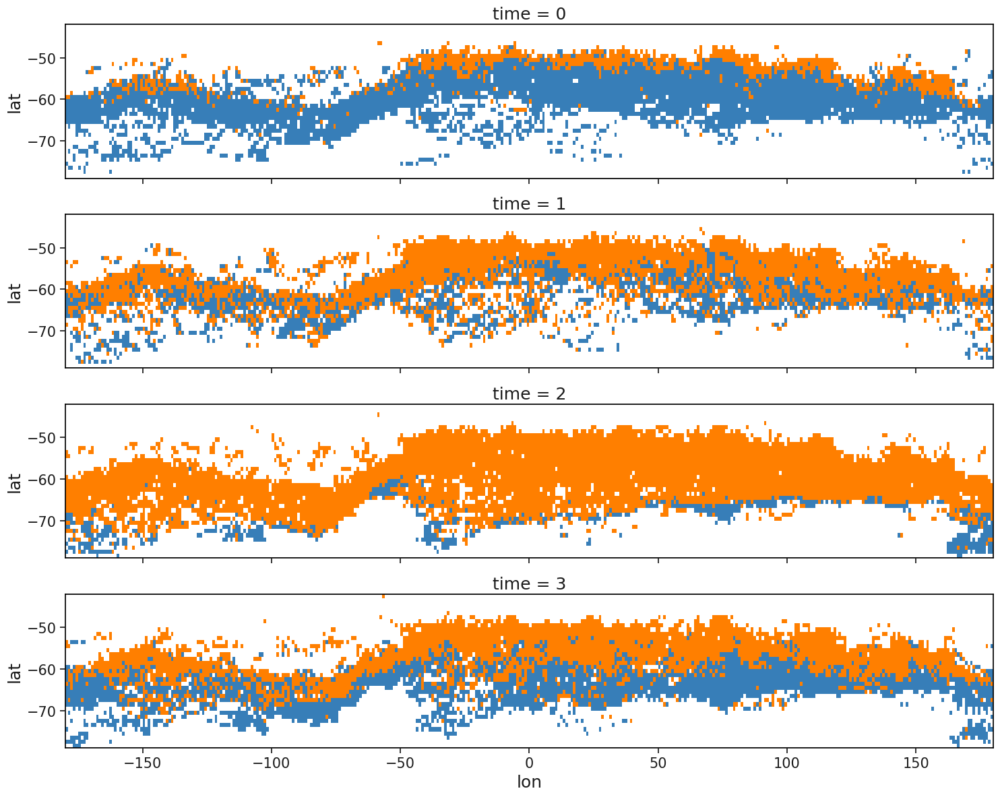

In [53]:
import matplotlib.colors as mpl_colors
cm = mpl_colors.LinearSegmentedColormap.from_list("", ['#377eb8', '#ff7f00'])
ds_ww.ww_type.plot(row='time',x='lon',y='lat',cmap=cm,levels=3,vmin=0,vmax=3,add_colorbar=False,
            figsize=(15,12))

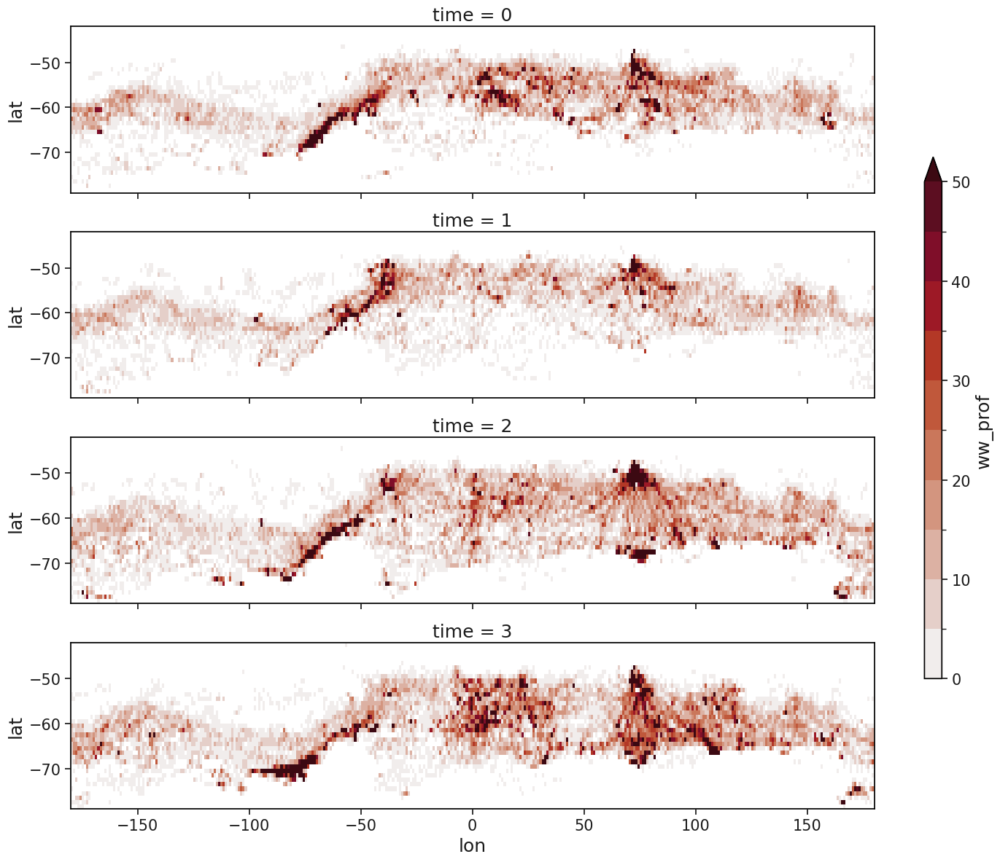

In [69]:
import matplotlib.colors as mpl_colors
cm = mpl_colors.LinearSegmentedColormap.from_list("", ['#377eb8', '#ff7f00'])
hmp=ds_ww.ww_prof.plot(row='time',x='lon',y='lat',cmap='cmo.amp',levels=11,vmin=0,vmax=50,add_colorbar=1,
            figsize=(15,12),cbar_kwargs=dict(aspect=30,shrink=2/3))

(0.0, 300.0)

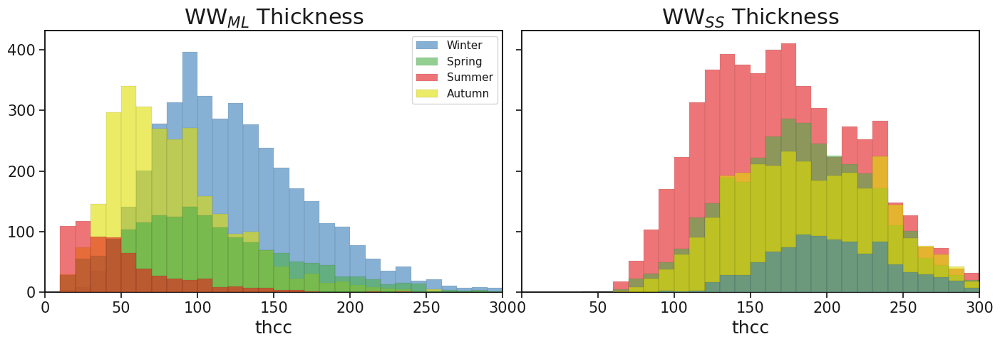

In [57]:
fig,ax = plt.subplots(1,2,figsize=(14,5),sharex=1,sharey=1)
ax = ax.flatten()

szn = ['Winter', 'Spring', 'Summer', 'Autumn']
colors = ['#377eb8', '#4daf4a', '#e41a1c', '#dede00',]

thcc_ss = ds_ww.thcc.where(ds_ww.ww_type==2)
thcc_ml = ds_ww.thcc.where(ds_ww.ww_type==1)

# zorders
z_ml = [1,3,4,2] #[4,3,2,1] #[Sm,Sp,Aut,Win]
z_ss = [4,2,1,3] #[4,3,2,1] #[Win,Aut,Spr,Sum]
bins=np.arange(0,301,10)
hist_kwargs = dict(bins=bins,alpha=0.6,edgecolor=None,linewidth=0.1)
for i in range(4):
    thcc_ml[i].plot.hist(color=colors[i],label=szn[i],ax=ax[0],**hist_kwargs,zorder=z_ml[i])
    
    
    thcc_ss[i].plot.hist(color=colors[i],label=szn[i],ax=ax[1],**hist_kwargs,zorder=z_ss[i])

ax[0].set_title(r'WW$_{ML}$ Thickness')
ax[1].set_title(r'WW$_{SS}$ Thickness')

ax[0].legend()

fig.tight_layout()

plt.xlim(bins.min(),bins.max())

In [58]:
import numpy as np

def add_median(var_data,ax,i,colors,bins):
    median = var_data[i].median().data
    ax.axvline(median,c=colors[i],ls='--',alpha=1,lw=2)
    #ax.annotate(text=int(median), xy=(median/(bins.max()-bins.min())-0.0275, 0.95), xycoords='axes fraction', 
     #              fontsize=12, ha='center', color=colors[i])

def plot_variable_histogram(ax, ds, var, var_name, bins=np.arange(0, 301, 10), add_legend=1, z_ml=None, z_ss=None):
    """
    Plots histograms for two categories (ML and SS) of a given variable across four seasons,
    ordering them by their total area so that the largest histogram is at the back and the smallest is at the front.

    Parameters:
    - ax: A list of Matplotlib axes objects where the first element is for ML category and the second for SS category.
    - ds: A xarray Dataset containing the variable of interest and the ww_type attribute indicating the category (ML or SS).
    - var: The name of the variable to plot histograms for.
    - bins: An optional parameter specifying the bin edges for the histogram. Default is evenly spaced values from 0 to 300.
    - add_legend: A boolean flag indicating whether to add a legend to the first subplot. Default is True.
    - z_ml: Optional list of z-order values for the ML category histograms. If None, calculated based on histogram areas.
    - z_ss: Optional list of z-order values for the SS category histograms. If None, calculated based on histogram areas.

    Description:
    This function dynamically calculates the area under each histogram and sorts them before plotting,
    ensuring that the histogram with the largest area is plotted last, and the one with the smallest area is plotted first.
    This approach enhances the visibility of the smaller histograms behind the larger ones, providing a clearer comparison
    between the ML and SS categories across four seasons (Winter, Spring, Summer, Autumn). The z-ordering of the histograms
    can be manually specified through the z_ml and z_ss parameters, or automatically calculated based on the histogram areas
    if these parameters are set to None.

    Implementation Details:
    - Season names and color codes are predefined to maintain consistency across plots.
    - Data filtering is performed using the .where() method on the dataset, selecting rows where the ww_type attribute matches either ML (2) or SS (1).
    - The area under each histogram is calculated using np.sum(), and the histograms are sorted based on these areas.
    - Z-ordering is applied to differentiate between seasons and categories in the overlaying histograms, ensuring visual clarity.
    - Histogram plotting parameters are standardized to ensure uniformity across all plots generated by this function.
    - Titles for the subplots are constructed dynamically using the variable name, enhancing the interpretability of the plots.
    - Legends are conditionally added to the first subplot based on the add_legend flag, providing additional context for the data visualization.
    - X-axis limits are set globally for both subplots to ensure consistency in the scale of the histograms.
    """
    
    # Define season names and color codes
    szn = ['Winter', 'Spring', 'Summer', 'Autumn']
    colors = ['#377eb8', '#4daf4a', '#e41a1c', '#dede00',]
    
    # Filter the dataset for ML and SS categories
    thcc_ss = ds[var].where(ds_ww.ww_type==2)
    thcc_ml = ds[var].where(ds_ww.ww_type==1)
    
    # Calculate the area under each histogram and sort them if z_ml and z_ss are None
    if z_ml is None:
        areas_ml = [np.sum(thcc_ml[i]) for i in range(4)]
        sorted_indices_ml = np.argsort(areas_ml)[::-1]  # Sort in descending order
        z_ml = sorted_indices_ml + 1  # Adjusted to start from 1 for z-ordering
    if z_ss is None:
        areas_ss = [np.sum(thcc_ss[i]) for i in range(4)]
        sorted_indices_ss = np.argsort(areas_ss)[::-1]  # Sort in descending order
        z_ss = sorted_indices_ss + 1  # Adjusted to start from 1 for z-ordering
    
    # Histogram plotting parameters
    hist_kwargs = dict(bins=bins, alpha=0.8, edgecolor=None, linewidth=0.1)
    for i in range(4):
        # Plot histograms for ML and SS categories separately, ordered by their areas
        thcc_ml[i].plot.hist(color=colors[i], label=szn[i], ax=ax[0], **hist_kwargs, zorder=z_ml[i])
        add_median(thcc_ml,ax[0],i,colors,bins)
        
        thcc_ss[i].plot.hist(color=colors[i], label=szn[i], ax=ax[1], **hist_kwargs, zorder=z_ss[i])
        add_median(thcc_ss,ax[1],i,colors,bins)
    
    # Set titles for the subplots
    ax[0].set_title(r'WW$_{ML}$ '+var_name)
    ax[1].set_title(r'WW$_{SS}$ '+var_name)

    
    # Add legend to the first subplot
    if add_legend:
        # add a grey dashed line to the legend
        ax[0].plot([], [], 'k--', label='Median')
        ax[0].legend()
    
    # Set x-axis limits for both subplots
    ax[0].set_xlim(bins.min(), bins.max())
    ax[0].set_ylabel('Number of Grid Cells [-]')

    for a in ax:
        a.set_facecolor('#d0d0d0')

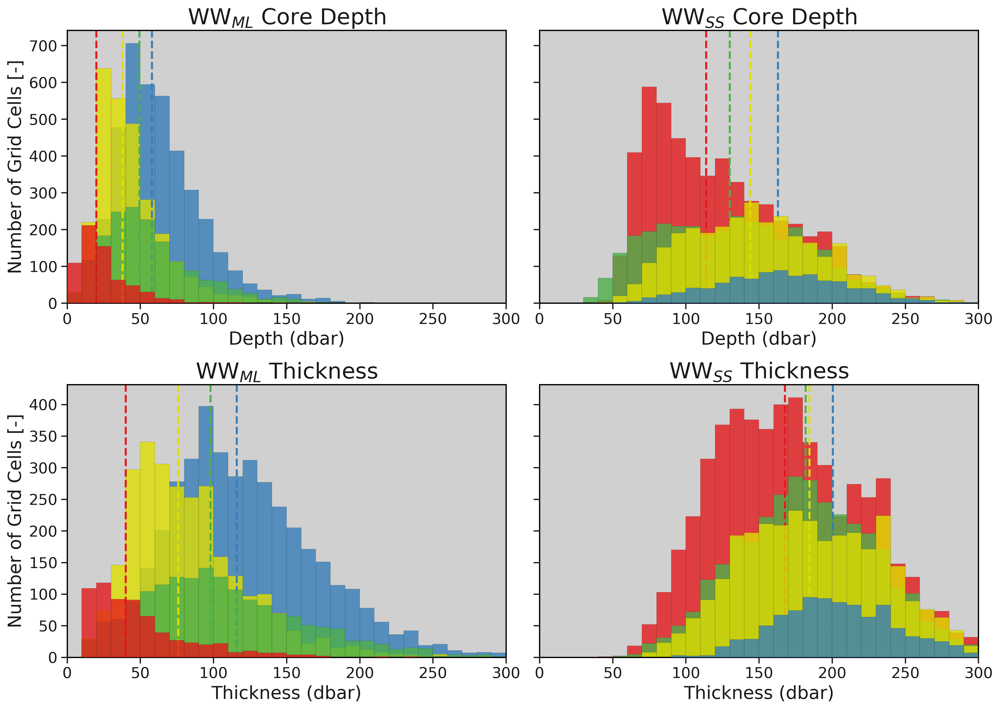

In [61]:
fig,ax = plt.subplots(2,2,figsize=(14,10),sharex='row',sharey='row',dpi=300)
ax = ax.flatten()

# plot core depth and thickness
plot_variable_histogram(ax=ax[:2],ds=ds_ww,var='ww_cp',var_name='Core Depth',z_ml=[0,2,3,1],z_ss=[4,1,0,2],add_legend=0)
plot_variable_histogram(ax=ax[-2:],ds=ds_ww,var='thcc',var_name='Thickness',z_ml=[0,2,3,1],z_ss=[4,1,0,2],add_legend=0)

for a in ax[:2]:
    a.set_xlabel('Depth (dbar)')
for a in ax[-2:]:
    a.set_xlabel('Thickness (dbar)')

fig.tight_layout()

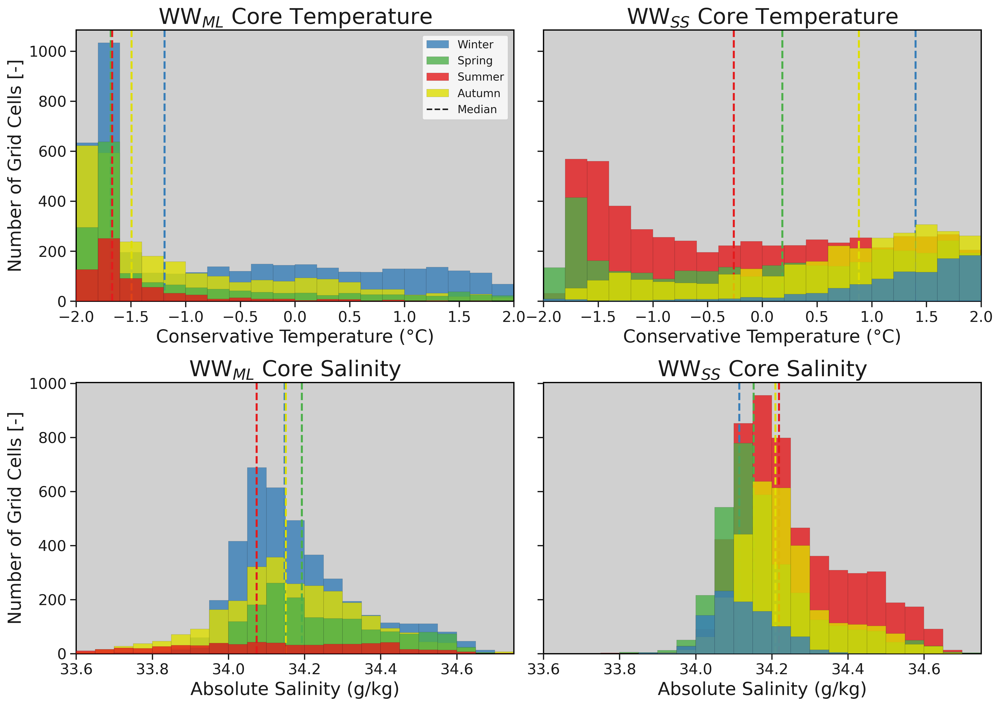

In [62]:
fig,ax = plt.subplots(2,2,figsize=(14,10),sharex='row',sharey='row',dpi=300)
ax = ax.flatten()

# plot core T & S
plot_variable_histogram(ax=ax[:2],ds=ds_ww,var='ww_ct',var_name='Core Temperature', add_legend=1,
                        bins=np.arange(-2,2.1,.2), z_ml=[0,2,4,1], z_ss=[3,1,0,2])
plot_variable_histogram(ax=ax[2:4],ds=ds_ww,var='ww_sa',var_name='Core Salinity', add_legend=0,
                        bins=np.arange(33.6,34.8,.05),z_ml=[0,2,3,1], z_ss=[4,2,1,3],)

for a in ax[:2]:
    a.set_xlabel('Conservative Temperature (°C)')
for a in ax[2:4]:
    a.set_xlabel('Absolute Salinity (g/kg)')

fig.tight_layout()

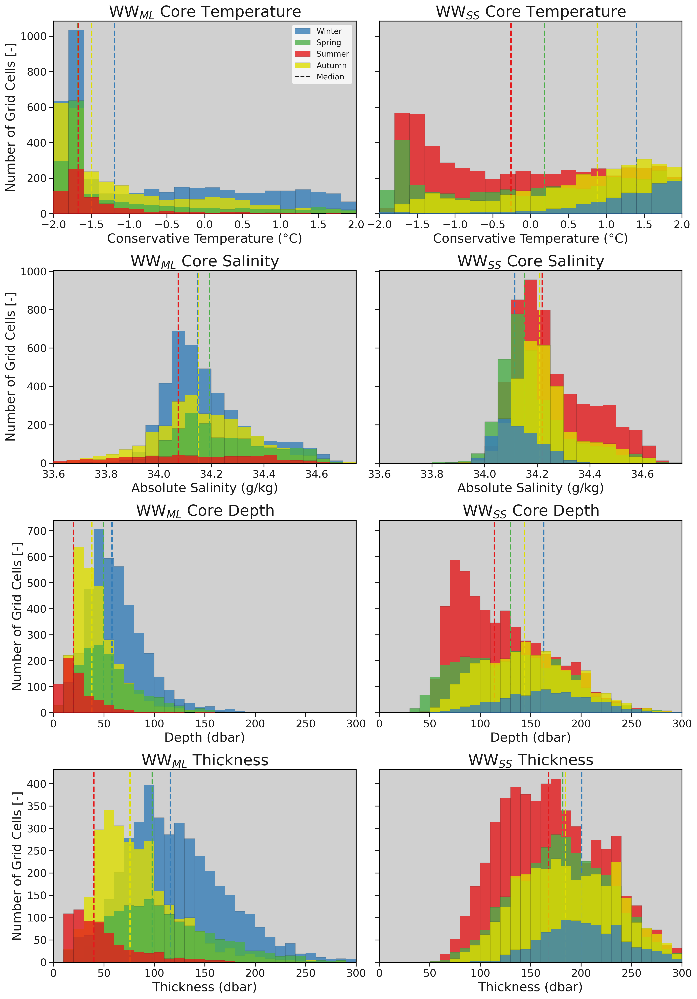

In [60]:
fig,ax = plt.subplots(4,2,figsize=(14,20),sharex='row',sharey='row',dpi=300)
ax = ax.flatten()

# plot core T & S
plot_variable_histogram(ax=ax[:2],ds=ds_ww,var='ww_ct',var_name='Core Temperature', add_legend=1,
                        bins=np.arange(-2,2.1,.2), z_ml=[0,2,4,1], z_ss=[3,1,0,2])
plot_variable_histogram(ax=ax[2:4],ds=ds_ww,var='ww_sa',var_name='Core Salinity', add_legend=0,
                        bins=np.arange(33.6,34.8,.05),z_ml=[0,2,3,1], z_ss=[4,2,1,3],)

for a in ax[:2]:
    a.set_xlabel('Conservative Temperature (°C)')
for a in ax[2:4]:
    a.set_xlabel('Absolute Salinity (g/kg)')

# plot core depth and thickness
plot_variable_histogram(ax=ax[4:6],ds=ds_ww,var='ww_cp',var_name='Core Depth',z_ml=[0,2,3,1],z_ss=[4,1,0,2],add_legend=0)
plot_variable_histogram(ax=ax[6:8],ds=ds_ww,var='thcc',var_name='Thickness',z_ml=[0,2,3,1],z_ss=[4,1,0,2],add_legend=0)

for a in ax[4:6]:
    a.set_xlabel('Depth (dbar)')
for a in ax[6:8]:
    a.set_xlabel('Thickness (dbar)')

fig.tight_layout()

In [78]:
ds_ww.thcc

cols = ['#e41a1c', '#dede00', '#377eb8', '#4daf4a']
x = 4
bins = np.arange(0, 400 + x, x)
y_annotate = 0.5
# Generate alphabetical labels
labels = [chr(i) for i in range(ord('a'), ord('d')+1)]

thcc_ss = ds_ww.thcc.where(ds_ww.ww_type==2)
thcc_ml = ds_ww.thcc.where(ds_ww.ww_type==1)

for i in range(4):
    ax[0].hist(thcc_ss[i], bins=bins, label=labels[i], alpha=0.4, color=cols[i], lw=0.5)
    ax[1].hist(thcc_ml[i], bins=bins, label=labels[i], alpha=0.4, color=cols[i], lw=0.5)
    if app_ is None:
        app = np.append(gr_ss[i].data, gr_ml[i].data)
    else:
        app = app_[i]
    ax[2].hist(app, bins=bins, label=labels[i], alpha=0.4, color=cols[i], lw=0.5)
    
    for a, g in zip(ax, [gr_ss[i].data, gr_ml[i].data, app]):
        if stat == 'median':
            a.annotate(text=labels[i] + ': ' + str(int(np.nanmedian(g))), xy=(0.7, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
        if stat == 'mean':
            a.annotate(text=labels[i] + ': ' + str(int(np.nanmean(g))), xy=(0.7, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
        if stat == 'mode':
            a.annotate(text=labels[i] + ': ' + str(int(mode(g, nan_policy='omit').mode)), xy=(0.7, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
        if stat == 'all':
            # first, label season
            a.annotate(text=labels[i] + ': ', xy=(0.62, y_annotate), xycoords='axes fraction', fontsize=12, ha='right')
            # median
            a.annotate(text=str(int(np.nanmedian(g))), xy=(0.7, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
            # mean
            a.annotate(text=str(int(np.nanmean(g))), xy=(0.8, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
            # mode
            a.annotate(text=str(int(mode(g[g > 0], nan_policy='omit').mode)), xy=(0.9, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
        y_annotate = y_annotate - 0.02

if stat == 'all':
    for a in ax:
        a.annotate(text='median', xy=(0.7, 0.5 + 0.08), xycoords='axes fraction', fontsize=12, ha='center')
        a.annotate(text='mean', xy=(0.8, 0.5 + 0.08), xycoords='axes fraction', fontsize=12, ha='center')
        a.annotate(text='mode', xy=(0.9, 0.5 + 0.08), xycoords='axes fraction', fontsize=12, ha='center')
else:
    for a in ax:
        a.annotate(text=stat + ':', xy=(0.7, 0.5 + 0.08), xycoords='axes fraction', fontsize=12, ha='center')

ax[0].set_title('WW_SS thickness', fontsize=20)
ax[1].set_title('WW_ML thickness', fontsize=20)
ax[2].set_title('Both WW types thickness', fontsize=20)

ax[0].set_xlim(0 - 5, 400)
for a in ax:
    a.legend()

ValueError: The 'color' keyword argument must have one color per dataset, but 39 datasets and 1 colors were provided

In [79]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mode

def plot_hist_thcc(ax, gr_ss, gr_ml, app_=None, x=4, stat='all'):
    cols = ['#e41a1c', '#dede00', '#377eb8', '#4daf4a']
    x = 4
    bins = np.arange(0, 400 + x, x)
    y_annotate = 0.5
    # Generate alphabetical labels
    labels = [chr(i) for i in range(ord('A'), ord('D')+1)]
    
    for i in range(4):
        ax[0].hist(gr_ss[i], bins=bins, label=labels[i], alpha=0.4, color=cols[i], lw=0.5)
        ax[1].hist(gr_ml[i], bins=bins, label=labels[i], alpha=0.4, color=cols[i], lw=0.5)
        if app_ is None:
            app = np.append(gr_ss[i].data, gr_ml[i].data)
        else:
            app = app_[i]
        ax[2].hist(app, bins=bins, label=labels[i], alpha=0.4, color=cols[i], lw=0.5)
        
        for a, g in zip(ax, [gr_ss[i].data, gr_ml[i].data, app]):
            if stat == 'median':
                a.annotate(text=labels[i] + ': ' + str(int(np.nanmedian(g))), xy=(0.7, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
            if stat == 'mean':
                a.annotate(text=labels[i] + ': ' + str(int(np.nanmean(g))), xy=(0.7, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
            if stat == 'mode':
                a.annotate(text=labels[i] + ': ' + str(int(mode(g, nan_policy='omit').mode)), xy=(0.7, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
            if stat == 'all':
                # first, label season
                a.annotate(text=labels[i] + ': ', xy=(0.62, y_annotate), xycoords='axes fraction', fontsize=12, ha='right')
                # median
                a.annotate(text=str(int(np.nanmedian(g))), xy=(0.7, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
                # mean
                a.annotate(text=str(int(np.nanmean(g))), xy=(0.8, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
                # mode
                a.annotate(text=str(int(mode(g[g > 0], nan_policy='omit').mode)), xy=(0.9, y_annotate), xycoords='axes fraction', fontsize=12, ha='center')
            y_annotate = y_annotate - 0.02
    
    if stat == 'all':
        for a in ax:
            a.annotate(text='median', xy=(0.7, 0.5 + 0.08), xycoords='axes fraction', fontsize=12, ha='center')
            a.annotate(text='mean', xy=(0.8, 0.5 + 0.08), xycoords='axes fraction', fontsize=12, ha='center')
            a.annotate(text='mode', xy=(0.9, 0.5 + 0.08), xycoords='axes fraction', fontsize=12, ha='center')
    else:
        for a in ax:
            a.annotate(text=stat + ':', xy=(0.7, 0.5 + 0.08), xycoords='axes fraction', fontsize=12, ha='center')

    ax[0].set_title('WW_SS thickness', fontsize=20)
    ax[1].set_title('WW_ML thickness', fontsize=20)
    ax[2].set_title('Both WW types thickness', fontsize=20)
    
    ax[0].set_xlim(0 - 5, 400)
    for a in ax:
        a.legend()

In [ ]:
def plot_hist_thcc(ax,gr_ss,gr_ml,app_=None,x=4,stat='mean'):
    cols = ['#e41a1c', '#dede00', '#377eb8', '#4daf4a']
    x=4
    bins = np.arange(0,400+x,x)
    y_annotate = 0.5
    for i in range(4):
        ax[0].hist(gr_ss[i],bins=bins,label=szn[i],alpha=0.4,color=cols[i],lw=0.5)
        ax[1].hist(gr_ml[i],bins=bins,label=szn[i],alpha=0.4,color=cols[i],lw=0.5)
        if app_ is None:
            app = np.append(gr_ss[i].data,gr_ml[i].data)
        else:
            app = app_[i]
        ax[2].hist(app,bins=bins,label=szn[i],alpha=0.4,color=cols[i],lw=0.5)
        
        for a,g in zip(ax,[gr_ss[i].data,gr_ml[i].data,app],):
            if stat=='median':
                a.annotate(text=szn[i]+': '+str(int(np.nanmedian(g))),xy=(0.6,y_annotate),xycoords='axes fraction',fontsize=12,ha='center')
            if stat=='mean':
                a.annotate(text=szn[i]+': '+str(int(np.nanmean(g))),xy=(0.6,y_annotate),xycoords='axes fraction',fontsize=12,ha='center')
            if stat=='both':
                # first, label season
                a.annotate(text=szn[i]+': ',xy=(0.6,y_annotate),xycoords='axes fraction',fontsize=12,ha='right')
                # median
                a.annotate(text=str(int(np.nanmedian(g))),xy=(0.6,y_annotate),xycoords='axes fraction',fontsize=12,ha='center')
                # mean
                a.annotate(text=str(int(np.nanmean(g))),xy=(0.6,y_annotate),xycoords='axes fraction',fontsize=12,ha='center')
            y_annotate = y_annotate - 0.02
    
    if stat=='both':
        a.annotate(text='median',xy=(0.6,0.5+0.08),xycoords='axes fraction',fontsize=12,ha='center')
        a.annotate(text='mean',xy=(0.6,0.5+0.08),xycoords='axes fraction',fontsize=12,ha='center')
        
    for a in ax:
        a.annotate(text=stat+':',xy=(0.6,0.5+0.08),xycoords='axes fraction',fontsize=12,ha='center')

    ax[0].set_title('WW_SS thickness',fontsize=20)
    ax[1].set_title('WW_ML thickness',fontsize=20)
    ax[2].set_title('Both WW types thickness',fontsize=20)
    
    ax[0].set_xlim(0-5,400)
    ax[0].legend()

# for another time...

Identifying proifles that contain spurious patches of nans in the middle. probs should be removed...

In [65]:
num_invs[num_invs.sum('pres')<2].n_prof

<xarray.DataArray 'n_prof' (n_prof: 2602)>
array([   615,    677,    683, ..., 617256, 617257, 618912])
Coordinates:
  * n_prof   (n_prof) int64 615 677 683 743 910 ... 617146 617256 617257 618912
    lon      (n_prof) float64 -171.4 -179.8 -179.8 ... -99.47 80.52 -175.9
    lat      (n_prof) float64 -72.03 -69.11 -69.09 ... -51.81 -51.81 -71.87
    time     (n_prof) datetime64[ns] 2004-03-18T19:30:00 ... 2021-12-03T14:11:26

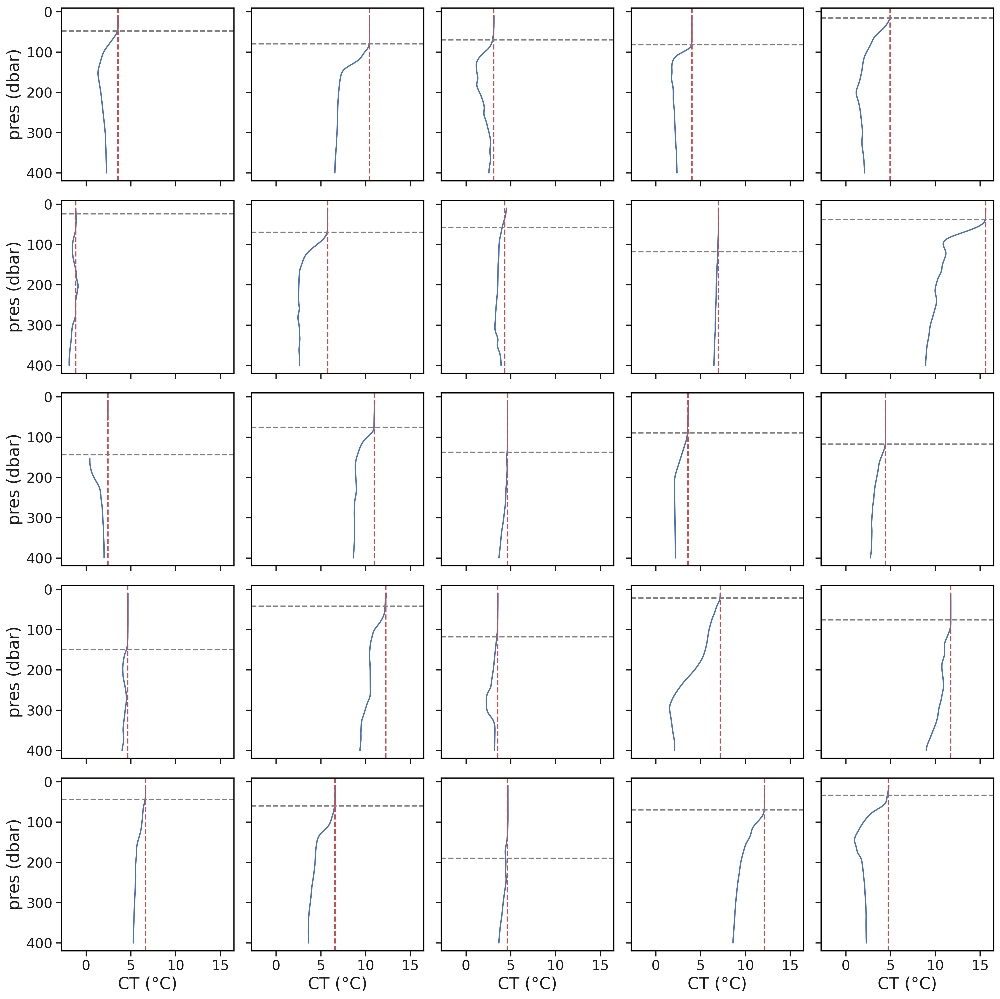

In [74]:
# randomly selected deep mixing profiles

r = 5
fig, ax = plt.subplots(r, r, figsize=(15, 15), sharey=True, sharex=True, dpi=300)
ax = ax.flatten()

# randomly select some profiles
x = np.asarray(np.random.choice(num_invs[num_invs.sum('pres')>100].n_prof, r**2, replace=0))

# Loop over each subplot
for i, l, a in zip(range(len(ax)), x, ax):
    # Plot the original data
    ds.sel(n_prof=l).ctemp.plot(y='pres', ax=a)

    a.invert_yaxis()
    a.set_title('')
    a.set_xlabel('')
    a.set_ylabel('')

    a.axvline(ml_t.sel(n_prof=l),ls='--',c='r')
    a.axhline(ds.mlp.sel(n_prof=l),ls='--',c='grey')

# Set global limits for the plots
#plt.xlim(-2, 3)
plt.tight_layout()
#plt.show()

for a in ax[-r:]:
    a.set_xlabel('CT (°C)')

for a in ax[::5]:
    a.set_ylabel('pres (dbar)')

(array([   0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,  957.,
        1725., 1760., 1680., 1777., 1718., 1694., 1732., 1796., 3536.,
        2016., 1823., 1865., 2451., 1497., 1782., 1495., 1428., 1477.,
        1363., 1429., 1472., 1443., 1447.,  683.,  116.,   59.,   55.,
          59.,   35.,   76.,   38.,   27.,   60.,   69.,   61.,   38.,
          26.,   40.,   47.,   63.,   40.,   22.,   43.,   36.,   29.,
          28.,   28.,   28.,   26.,   50.,   25.,   11.,   24.,   27.,
          18.,   25.,   22.,   17.,   19.,   21.,   18.,   17.,    8.,
          15.,   20.,   18.,   25.,   15.,    8.,   18.,    9.,   10.,
          13.,    6.,   19.,    5.,    9.,    4.,    5.,   11.,    8.,
           4.,    6.,    5.,    0.,    0.,    0.,    0.,    0.,    0.,
           0.]),
 array([  0.,   2.,   4.,   6.,   8.,  10.,  12.,  14.,  16.,  18.,  20.,
         22.,  24.,  26.,  28.,  30.,  32.,  34.,  36.,  38.,  40.,  42.,
         44.,  46.,  48.,  50.,  52.,  54.,  56.,  58.

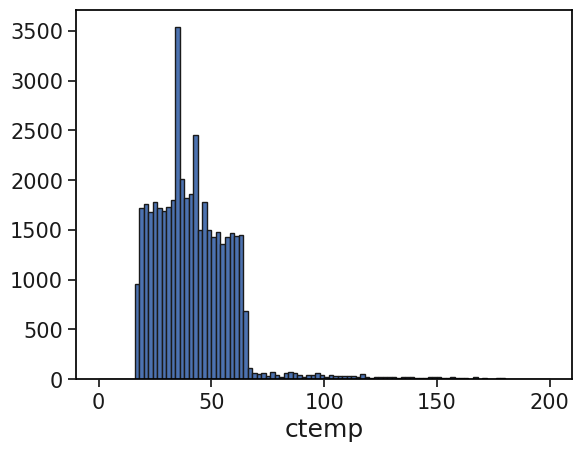

In [80]:
ds.ctemp.isnull().sum('pres')[ds.ctemp.isnull().sum('pres')>0].plot.hist(bins=np.arange(0,201,2))

(array([0.0000e+00, 3.7048e+04, 6.0410e+03, 1.7100e+02, 4.1900e+02,
        2.3000e+01, 2.7000e+01, 1.0000e+00, 0.0000e+00]),
 array([0., 1., 2., 3., 4., 5., 6., 7., 8., 9.]),
 <BarContainer object of 9 artists>)

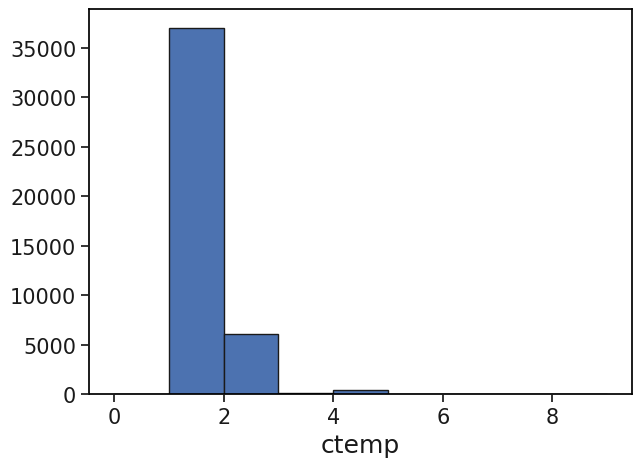

In [97]:
(ds.ctemp.isnull()[ds.ctemp.isnull().sum('pres')>0].astype(int).diff('pres').__abs__()>0).sum('pres'
        ).plot.hist(figsize=(7,5),bins=np.arange(0,10,1))

In [99]:
n_pr = (ds.ctemp.isnull()[ds.ctemp.isnull().sum('pres')>0].astype(int).diff('pres').__abs__()>0).sum('pres').n_prof

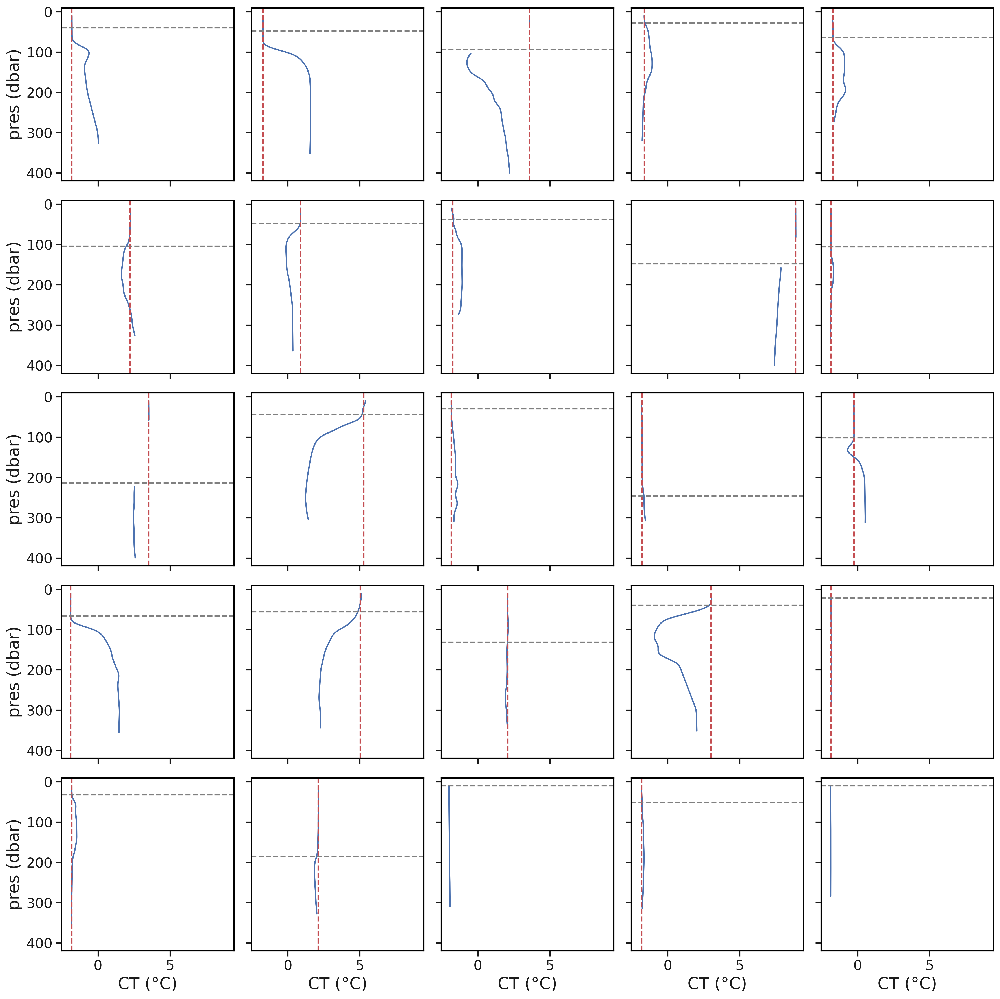

In [100]:
# randomly selected deep mixing profiles

r = 5
fig, ax = plt.subplots(r, r, figsize=(15, 15), sharey=True, sharex=True, dpi=300)
ax = ax.flatten()

# randomly select some profiles
x = np.asarray(np.random.choice(n_pr, r**2, replace=0))

# Loop over each subplot
for i, l, a in zip(range(len(ax)), x, ax):
    # Plot the original data
    ds.sel(n_prof=l).ctemp.plot(y='pres', ax=a)

    a.invert_yaxis()
    a.set_title('')
    a.set_xlabel('')
    a.set_ylabel('')

    a.axvline(ml_t.sel(n_prof=l),ls='--',c='r')
    a.axhline(ds.mlp.sel(n_prof=l),ls='--',c='grey')

# Set global limits for the plots
#plt.xlim(-2, 3)
plt.tight_layout()
#plt.show()

for a in ax[-r:]:
    a.set_xlabel('CT (°C)')

for a in ax[::5]:
    a.set_ylabel('pres (dbar)')

In [81]:
ds.ctemp.isnull().sum('pres')[ds.ctemp.isnull().sum('pres')>0]

<xarray.DataArray 'ctemp' (n_prof: 43730)>
array([37, 22, 24, ..., 34, 34, 69])
Coordinates:
  * n_prof   (n_prof) int64 38 224 249 276 298 ... 619979 620007 620063 620077
    lon      (n_prof) float64 ...
    lat      (n_prof) float64 ...
    time     (n_prof) datetime64[ns] ...

In [85]:
np.unique(ds.dsource[ds.ctemp.isnull().sum('pres')>0],return_counts=1)

(array([array('Argo', dtype=object), array('CTD', dtype=object),
        array('Gliders', dtype=object), array('MEOP', dtype=object)],
       dtype=object),
 array([ 9444,    79,   377, 33830]))